<a href="https://colab.research.google.com/github/atstuyuki/throwanalysis_googlecolab/blob/main/throwanalysis_20250109.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 最初に必要なライブラリをインストール
### 最初に1回だけ実行する（再生ボタン押下で実行）

In [1]:
!git clone https://github.com/atstuyuki/throwanalysis_googlecolab.git
!pip install mediapipe
%cd throwanalysis_googlecolab

Cloning into 'throwanalysis_googlecolab'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 12 (delta 2), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (12/12), 1.40 MiB | 12.06 MiB/s, done.
Resolving deltas: 100% (2/2), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 48.3 MB/s eta 0:00:00
/content/throwanalysis_googlecolab


# 最初に必要なライブラリをインストールすれば動画解析は以下のセルを*繰り返して実行*する

## 下の再生ボタンを押して投球動画ファイルを選択してクラウドにupload
### ファイル選択タブから動画をマウスで選択する
#### 真横（右投げなら3塁側　左投げなら1塁側）からとった動画の方が判別性能が高いです


In [2]:
# @title
# prompt: 動画ファイルをuploadしてfile_pathという変数に保存する
from google.colab import files

uploaded = files.upload()

file_path = list(uploaded.keys())[0]

print(f"Uploaded file path: {file_path}")

Saving Inui_rt.mp4 to Inui_rt.mp4
Uploaded file path: Inui_rt.mp4


# **右投げ**で頭・肘の軌跡を見たいときはここの再生ボタンを実行
## 左のタブのThrowanalysis＿googlecolabに検出済みmp4ファイルと座標のCSVファイルが作成されるのでダブルクリックでダウンロード

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


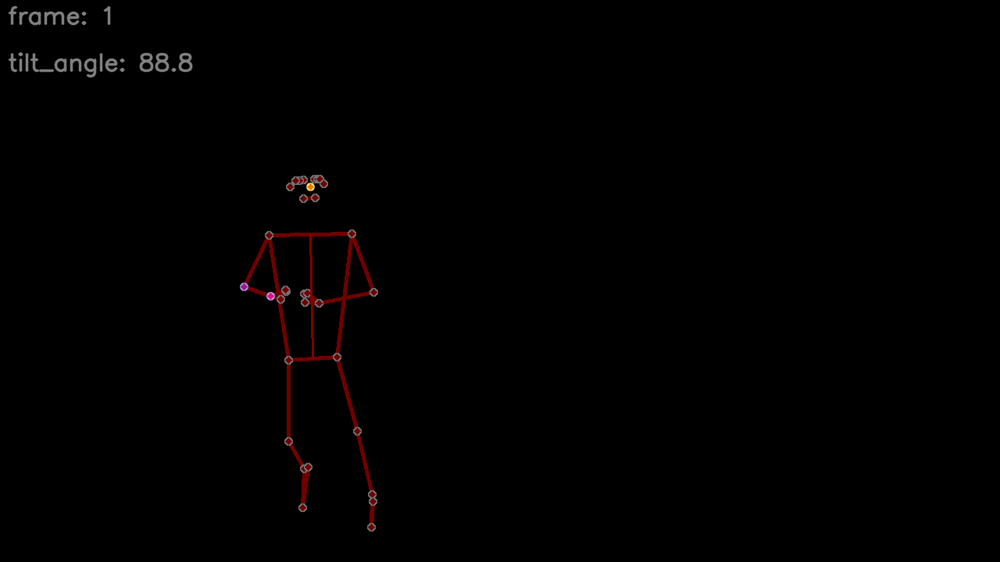

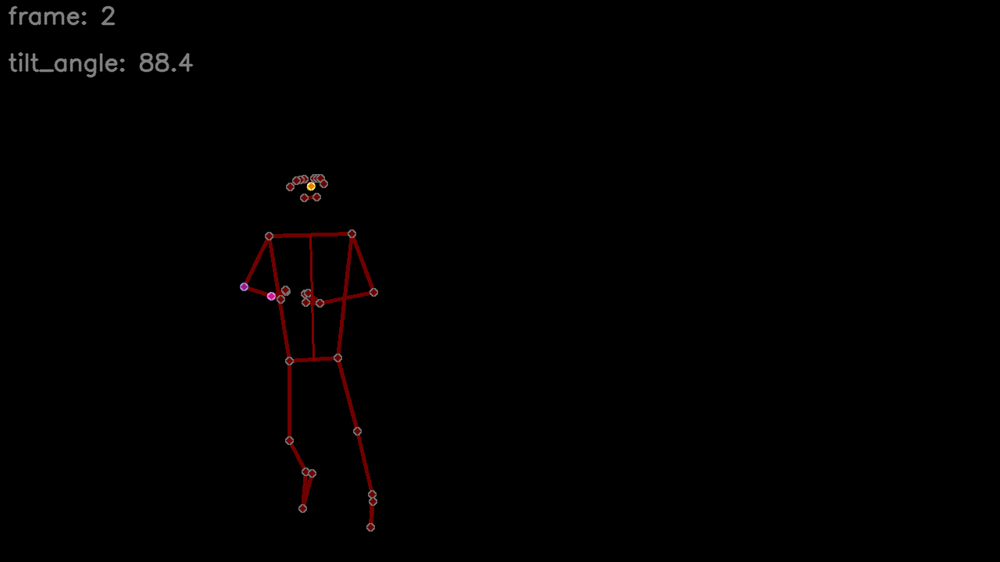

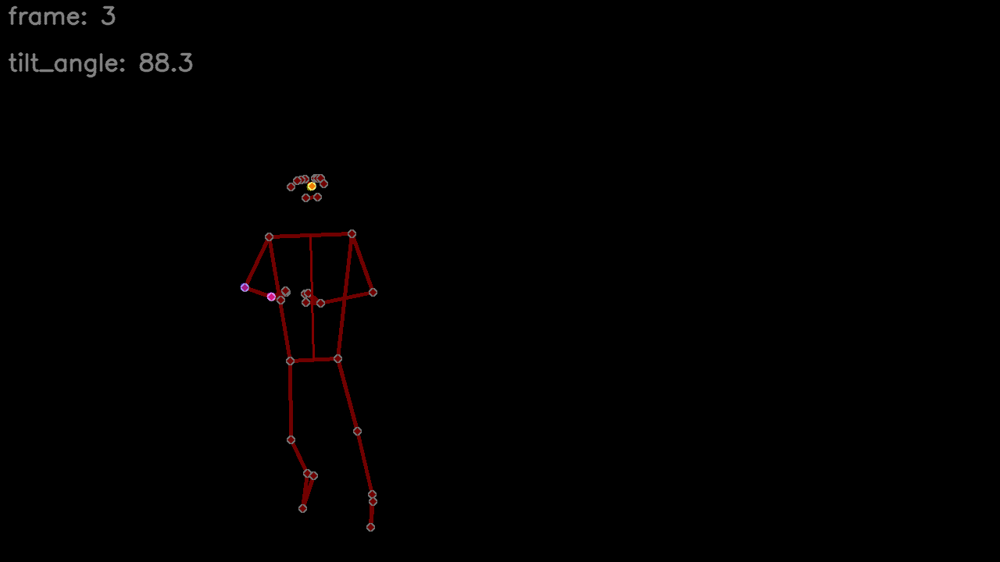

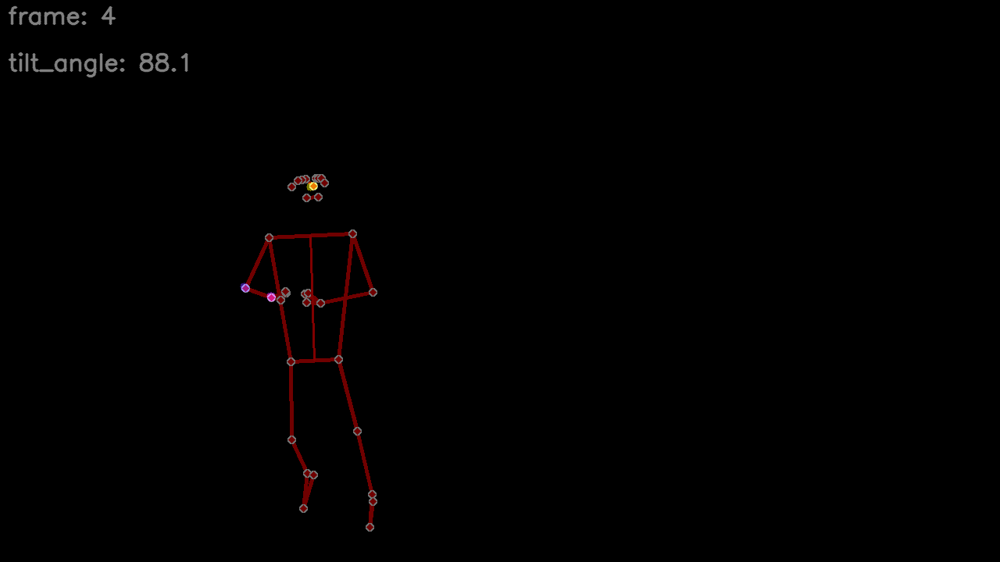

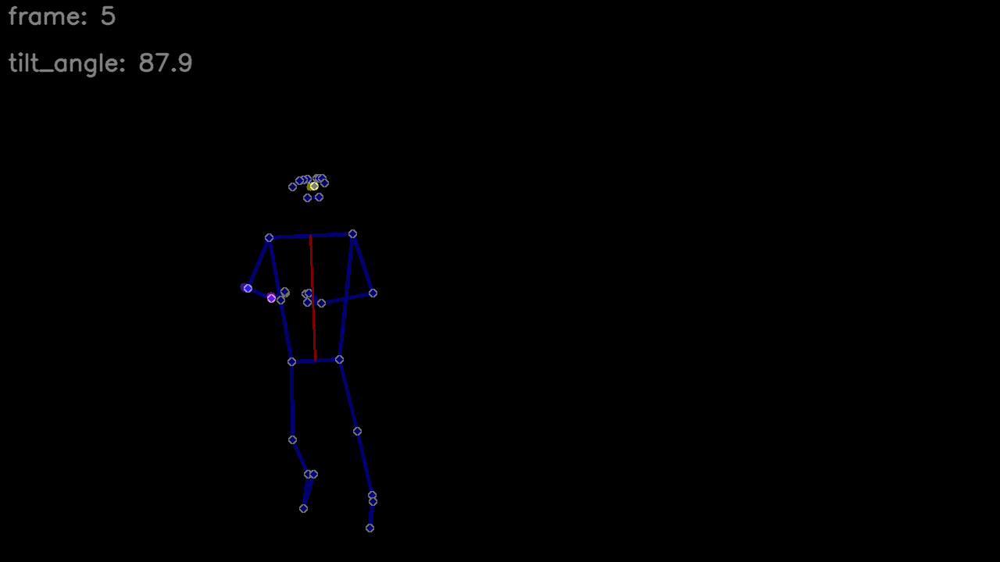

...

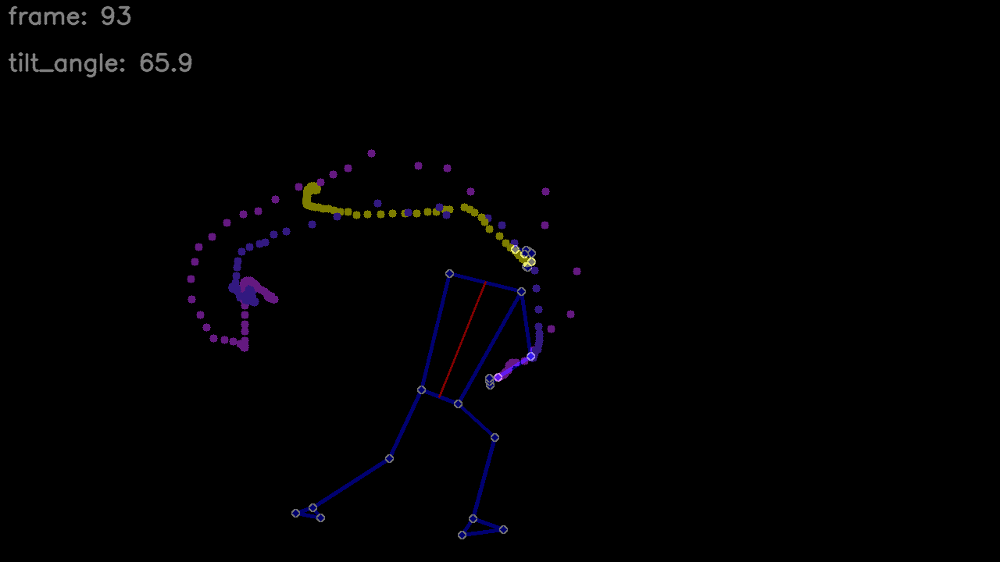

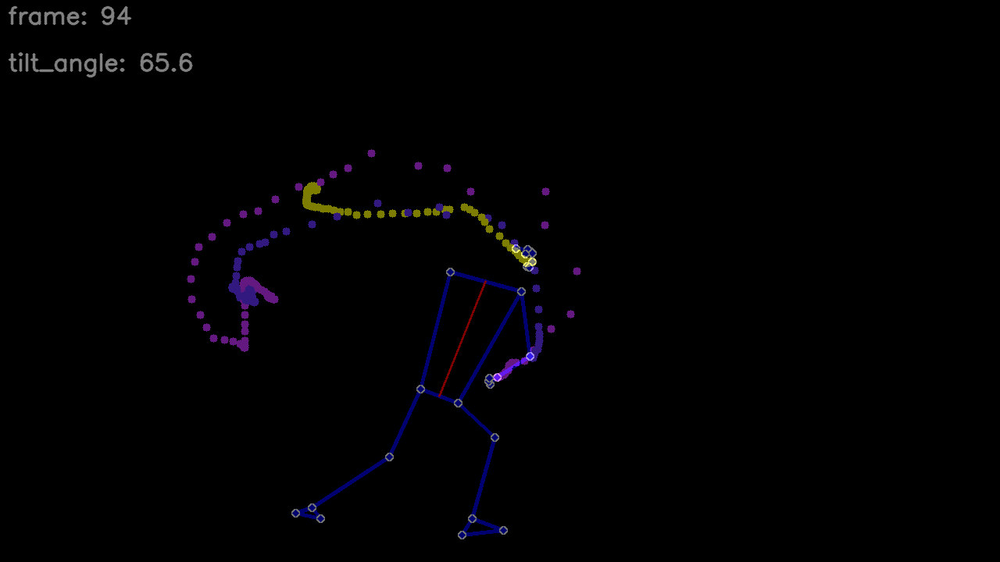

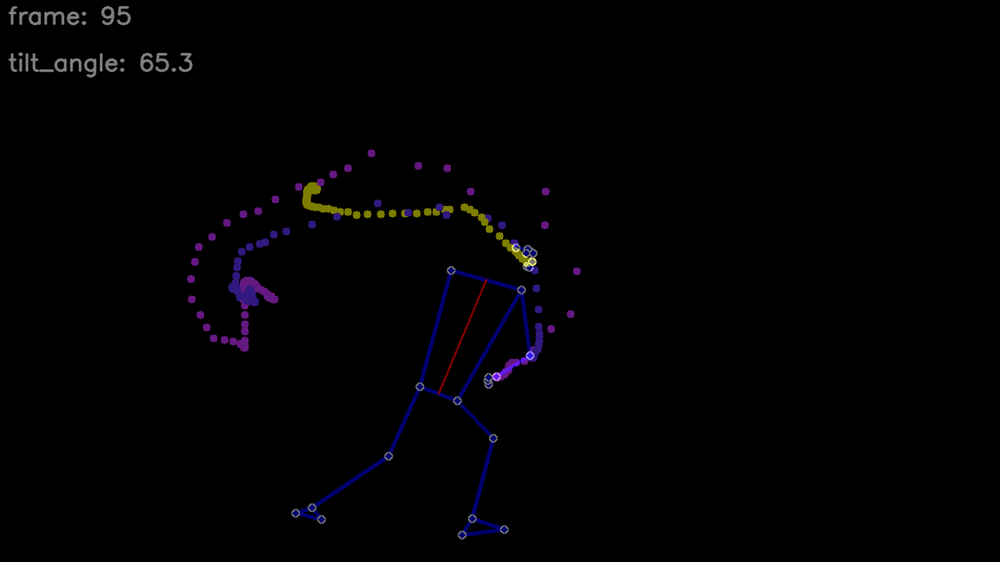

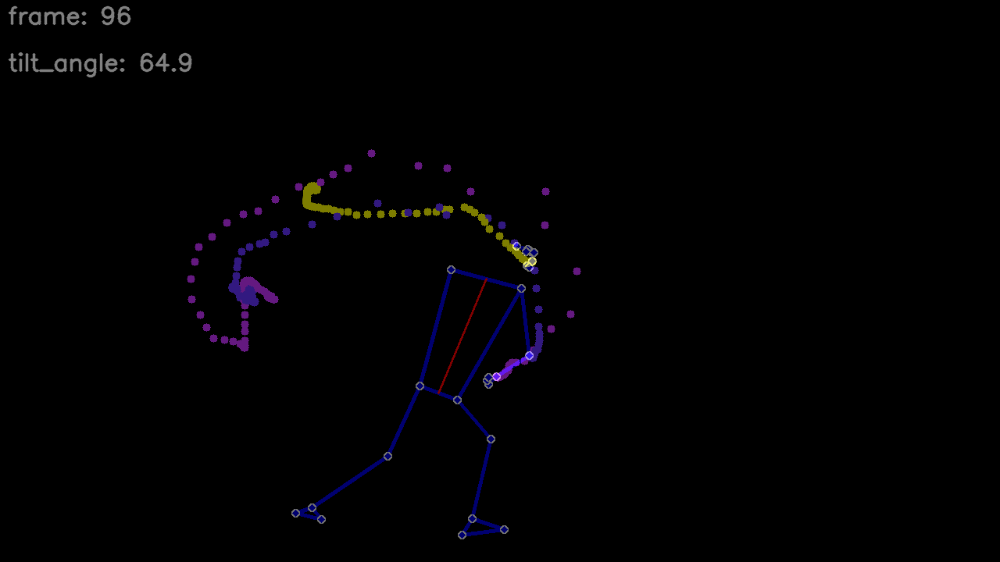

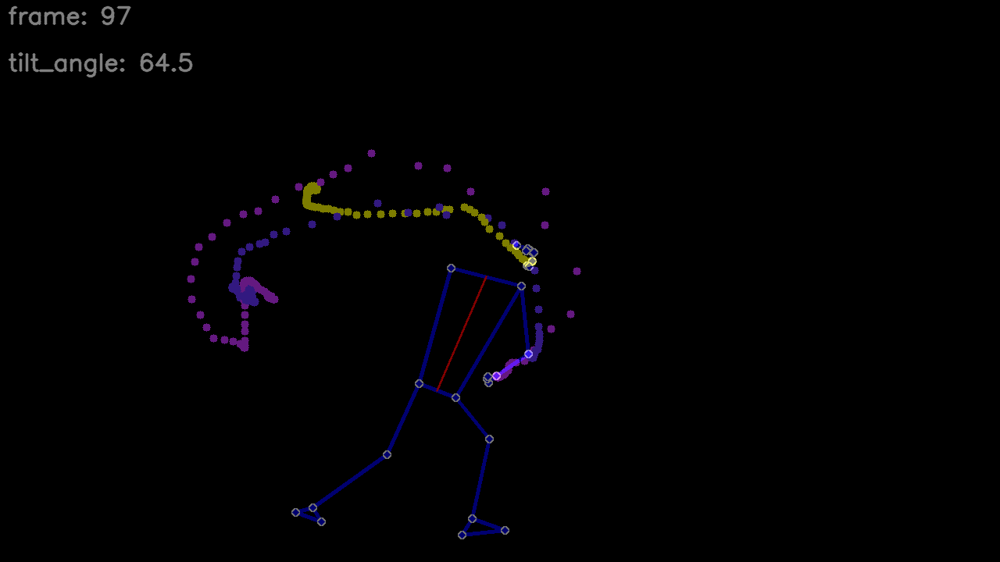

In [3]:
from re import L
# @title
import cv2
import mediapipe as mp
import csv
import os
import lightgbm as lgb
from datetime import datetime
import math
import numpy as np
import warnings
warnings.simplefilter('ignore')
# Import the cv2_imshow function from google.colab.patches
from google.colab.patches import cv2_imshow
#2点間の距離を計算する関数
def calculate_distance(x1, y1, x2, y2):
    return math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
#3点間の角度を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の角度を計算する

def calc_angle(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    absvec1 = np.linalg.norm(vec1)
    absvec2 = np.linalg.norm(vec2)
    inner = np.inner(vec1, vec2)
    cos_theta = inner / (absvec1 * absvec2)
    if np.isnan(cos_theta):  # cos_thetaがNaNだった場合は0を返す
        return 0
    cos_theta_value = cos_theta.item()
    theta = math.degrees(math.acos(cos_theta_value))
    return theta
#3点間の外積を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の外積を計算する
def calc_outerproduct(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    outer = np.cross(vec1, vec2)
    outer = outer*1000 #数値が小さいので1000倍しておく
    return outer

#pklファイルを解凍する
import pickle
model_path = "throwdetect_trained_lgb_model_2side_20241123.pkl"
model = pickle.load(open(model_path, 'rb'))


# 骨格を検出するための準備
mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose
# 動画ファイルを読み込む
cap = cv2.VideoCapture(file_path)

# 出力用CSVファイルを作成する
csv_file_name = os.path.splitext(os.path.basename(file_path))[0] + '_' + datetime.now().strftime('%Y%m%d_%H%M%S') + '.csv'
save_folder = os.path.dirname(file_path)
csv_file_path = os.path.join(save_folder, csv_file_name)
mp4_file_name = csv_file_name.replace('.csv', '.mp4')
mp4_file_path = os.path.join(save_folder, mp4_file_name)
# 出力用MP4ファイルを作成する
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter(mp4_file_path, fourcc, fps, (frame_width, frame_height))

with open(csv_file_path, mode='w', newline='') as f:
    writer = csv.writer(f)
    header = ['frame']
    for i in range(33):
        header.append(f'x{i}')
        header.append(f'y{i}')
        header.append(f'z{i}')
    header.append("norm_rt_forearm_dist")
    header.append("norm_rt_uparm_dist")
    header.append("norm_rt_hip_dist")
    header.append("norm_rt_knee_dist")
    header.append("norm_lt_hip_dist")
    header.append("norm_lt_knee_dist")
    header.append("rt_elbow_angle")
    header.append("rt_shoulder_angle")
    header.append("lt_elbow_angle")
    header.append("lt_shoulder_angle")
    header.append("rt_hip_angle")
    header.append("rt_knee_angle")
    header.append("lt_hip_angle")
    header.append("lt_knee_angle")
    header.append("shoulder_dist")
    header.append("hip_dist")
    header.append("shoulder_hip_ratio")
    header.append("norm_rt_elbow_size")
    header.append("norm_rt_shoulder_size")
    header.append("norm_rt_trunk_size")
    header.append("norm_lt_trunk_size")
    header.append("norm_rt_hip_size")
    header.append("norm_rt_knee_size")
    header.append("norm_lt_hip_size")
    header.append("norm_lt_knee_size")
    header.append("tilt_angle")
    header.append('throw_phase')

    writer.writerow(header)
    #black_imageを作成
    black_image = np.zeros((frame_height, frame_width, 3), np.uint8)
    with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5, static_image_mode=False,  smooth_landmarks=True, enable_segmentation=False) as pose:
        while cap.isOpened():
            ret, image = cap.read()
            if not ret:
                break

            # 骨格を検出する
            results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

            if results.pose_world_landmarks:
                row = [None]
                # フレーム番号を取得する
                frame = cap.get(cv2.CAP_PROP_POS_FRAMES)
                row[0] = frame
                #black_image2を作成
                black_image2 = np.zeros((frame_height, frame_width, 3), np.uint8)
                for i in range(33):
                    row.append(results.pose_world_landmarks.landmark[i].x)
                    row.append(results.pose_world_landmarks.landmark[i].y)
                    row.append(results.pose_world_landmarks.landmark[i].z)

                #lightGBMに渡すパラメータを検出する
                #右肩、右肘、右手首、左肩、左肘、左手首、右股関節、右ひざ、右足関節、左股関節、左ひざ、左足関節の12点の座標を取得する
                rt_shoulder_x = results.pose_world_landmarks.landmark[12].x
                rt_shoulder_y = results.pose_world_landmarks.landmark[12].y
                rt_elbow_x = results.pose_world_landmarks.landmark[14].x
                rt_elbow_y = results.pose_world_landmarks.landmark[14].y
                rt_wrist_x = results.pose_world_landmarks.landmark[16].x
                rt_wrist_y = results.pose_world_landmarks.landmark[16].y
                lt_shoulder_x = results.pose_world_landmarks.landmark[11].x
                lt_shoulder_y = results.pose_world_landmarks.landmark[11].y
                lt_elbow_x = results.pose_world_landmarks.landmark[13].x
                lt_elbow_y = results.pose_world_landmarks.landmark[13].y
                lt_wrist_x = results.pose_world_landmarks.landmark[15].x
                lt_wrist_y = results.pose_world_landmarks.landmark[15].y
                rt_hip_x = results.pose_world_landmarks.landmark[24].x
                rt_hip_y = results.pose_world_landmarks.landmark[24].y
                rt_knee_x = results.pose_world_landmarks.landmark[26].x
                rt_knee_y = results.pose_world_landmarks.landmark[26].y
                rt_ankle_x = results.pose_world_landmarks.landmark[28].x
                rt_ankle_y = results.pose_world_landmarks.landmark[28].y
                lt_hip_x = results.pose_world_landmarks.landmark[23].x
                lt_hip_y = results.pose_world_landmarks.landmark[23].y
                lt_knee_x = results.pose_world_landmarks.landmark[25].x
                lt_knee_y = results.pose_world_landmarks.landmark[25].y
                lt_ankle_x = results.pose_world_landmarks.landmark[27].x
                lt_ankle_y = results.pose_world_landmarks.landmark[27].y
                #右手関節ー右肘間の距離を計算
                rt_forearm_dist =calculate_distance(rt_wrist_x, rt_wrist_y, rt_elbow_x, rt_elbow_y)
                #右肩ー右股関節の長さ（基準軸）を計算
                rt_trunk_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y)
                #右肩ー右肘の長さ(uparm_dist)を計算
                rt_uparm_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y)
                #右股関節ー右膝の長さ(rt_hip_dist)を計算
                rt_hip_dist=calculate_distance(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y)
                #右膝ー右足首の長さ(rt_knee_dist)を計算
                rt_knee_dist =calculate_distance(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝の長さ(lt_hip_dist)を計算
                lt_hip_dist =calculate_distance(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y)
                #左膝ー左足首の長さ(lt_knee_dist)を計算
                lt_knee_dist=calculate_distance (lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y)
                #サイズを標準化するためにforarm_dist, uparm_distをtrunk_distで割る
                norm_rt_forearm_dist=rt_forearm_dist/rt_trunk_dist
                norm_rt_uparm_dist=rt_uparm_dist/rt_trunk_dist
                norm_rt_hip_dist=rt_hip_dist/rt_trunk_dist
                norm_rt_knee_dist=rt_knee_dist/rt_trunk_dist
                norm_lt_hip_dist=lt_hip_dist/rt_trunk_dist
                norm_lt_knee_dist=lt_knee_dist/rt_trunk_dist
                #肩の幅
                shoulder_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y)
                #股関節の幅
                hip_dist=calculate_distance(rt_hip_x, rt_hip_y, lt_hip_x, lt_hip_y)
                #shoulder_distをhip_distで割りshouder_hip_ratioとする
                shoulder_hip_ratio=shoulder_dist/hip_dist
                #右肩ー右肘ー右手関節のなす角度を計算 1つ目の座標が原点となる座標を入力
                rt_elbow_angle = calc_angle (rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #右肘ー右肩―右股関節のなす角度を計算
                rt_shoulder_angle = calc_angle (rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y, rt_elbow_x, rt_elbow_y)
                #左肩ー左肘ー左手関節のなす角度を計算
                lt_elbow_angle= calc_angle (lt_elbow_x, lt_elbow_y, lt_shoulder_x, lt_shoulder_y, lt_wrist_x, lt_wrist_y)
                #左肘ー左肩ー左股関節のなす角度を計算
                lt_shoulder_angle = calc_angle (lt_shoulder_x, lt_shoulder_y, lt_hip_x, lt_hip_y, lt_elbow_x, lt_elbow_y)
                #右肩ー右股関節ー右膝のなす角度を計算
                rt_hip_angle = calc_angle(rt_hip_x, rt_hip_y, rt_shoulder_x, rt_shoulder_y, rt_knee_x, rt_knee_y)
                #右股関節ー右膝ー右足首のなす角度を計算
                rt_knee_angle= calc_angle(rt_knee_x, rt_knee_y, rt_hip_x, rt_hip_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_hip_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_knee_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)

                #rt_elbow sizeは右肘ー右肩　右肘ー右手関節ベクトルの外積
                rt_elbow_size = calc_outerproduct(rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #rt_shoulder sizeは右肩ー右肘　右肩ー右股関節ベクトルの外積
                rt_shoulder_size= calc_outerproduct(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y, rt_hip_x, rt_hip_y)
                #rt_trunk_sizeは右肩ー左肩　右肩ー右股関節ベクトルの外積
                rt_trunk_size = calc_outerproduct(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y, rt_hip_x, rt_hip_y)
                #lt_trunk_sizeは左肩ー右肩　左肩ー左股関節ベクトルの外積
                lt_trunk_size = calc_outerproduct(lt_shoulder_x, lt_shoulder_y, rt_shoulder_x, rt_shoulder_y, lt_hip_x, lt_hip_y)
                #rt_hip_sizeは右股関節ー右膝　右股関節ー右肩ベクトルの外積
                rt_hip_size = calc_outerproduct(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y, rt_shoulder_x, rt_shoulder_y)
                #rt_knee_sizeは右膝ー右足首　右膝ー右股関節ベクトルの外積
                rt_knee_size = calc_outerproduct(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y, rt_hip_x, rt_hip_y)
                #lt_hip_sizeは左股関節ー左膝　左股関節ー左肩ベクトルの外積
                lt_hip_size = calc_outerproduct(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y, lt_shoulder_x, lt_shoulder_y)
                #lt_knee_sizeは左膝ー左足首　左膝ー左股関節ベクトルの外積
                lt_knee_size = calc_outerproduct(lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y, lt_hip_x, lt_hip_y)
                #サイズを標準化するためにrt_elbow_size, rt_shoulder_sizeをrt_trunk_distの2乗で割る
                norm_rt_elbow_size=rt_elbow_size/(rt_trunk_dist**2)
                norm_rt_shoulder_size=rt_shoulder_size/(rt_trunk_dist**2)
                norm_rt_trunk_size=rt_trunk_size/(rt_trunk_dist**2)
                norm_lt_trunk_size=lt_trunk_size/(rt_trunk_dist**2)
                norm_rt_hip_size=rt_hip_size/(rt_trunk_dist**2)
                norm_rt_knee_size=rt_knee_size/(rt_trunk_dist**2)
                norm_lt_hip_size=lt_hip_size/(rt_trunk_dist**2)
                norm_lt_knee_size=lt_knee_size/(rt_trunk_dist**2)
                #両肩と両股関節の中心をとおる直線と垂直な直線とのなす角度を計算
                #両肩の中点を計算
                shoulder_center_x = (rt_shoulder_x + lt_shoulder_x) / 2
                shoulder_center_y = (rt_shoulder_y + lt_shoulder_y) / 2
                #両股関節の中点を計算
                hip_center_x = (rt_hip_x + lt_hip_x) / 2
                hip_center_y = (rt_hip_y + lt_hip_y) / 2
                #両肩の中点と両股関節の中点を結ぶ直線と垂直線とのなす角度を計算
                tilt_angle = np.arctan((hip_center_y - shoulder_center_y) / (hip_center_x - shoulder_center_x)) * 180 / np.pi
                tilt_angle = round(tilt_angle, 3)
                #tilt_angleの絶対値を取得
                tilt_angle = abs(tilt_angle)

                #機械学習モデルに渡すパラメータを出力する
                test_x=[norm_rt_forearm_dist, norm_rt_uparm_dist, norm_rt_hip_dist, norm_rt_knee_dist, norm_lt_hip_dist, norm_lt_knee_dist,  rt_elbow_angle, rt_shoulder_angle, lt_elbow_angle, lt_shoulder_angle, rt_hip_angle, rt_knee_angle, lt_hip_angle, lt_knee_angle, shoulder_hip_ratio, norm_rt_elbow_size,norm_rt_shoulder_size, norm_rt_trunk_size, norm_lt_trunk_size, norm_rt_hip_size, norm_rt_knee_size, norm_lt_hip_size, norm_lt_knee_size]
                #print(test_x)
                #lightGBMにパラメータを渡す
                #test_xをnumpyのarrayに変換
                test_x = np.array([test_x])
                #test_x=test_x.reshape(1,len(test_x))
                result = model.predict(test_x)
                row.append(norm_rt_forearm_dist)
                row.append(norm_rt_uparm_dist)
                row.append(norm_rt_hip_dist)
                row.append(norm_rt_knee_dist)
                row.append(norm_lt_hip_dist)
                row.append(norm_lt_knee_dist)
                row.append(rt_elbow_angle)
                row.append(rt_shoulder_angle)
                row.append(lt_elbow_angle)
                row.append(lt_shoulder_angle)
                row.append(rt_hip_angle)
                row.append(rt_knee_angle)
                row.append(lt_hip_angle)
                row.append(lt_knee_angle)
                row.append(shoulder_dist)
                row.append(hip_dist)
                row.append(shoulder_hip_ratio)
                row.append(norm_rt_elbow_size)
                row.append(norm_rt_shoulder_size)
                row.append(norm_rt_trunk_size)
                row.append(norm_lt_trunk_size)
                row.append(norm_rt_hip_size)
                row.append(norm_rt_knee_size)
                row.append(norm_lt_hip_size)
                row.append(norm_lt_knee_size)
                row.append(tilt_angle)
                row.append(result[0])
                writer.writerow(row)
                #print(result)

            # blacl_imageに骨格の検出結果を描画する　描画は元の画像に上書きするのでworld系の座標は用いない
            if results.pose_world_landmarks:
                color=[np.round(225*(1-result[0])),0,np.round(225*result[0])]
                color=np.asarray(color, dtype = int).tolist()
                drawing_spec = mp_drawing.DrawingSpec(color=color,thickness=4, circle_radius=2) #color=[B,G,R]で指定,線の太さと〇の色も指定可能
                mp_drawing.draw_landmarks(
                    black_image2, results.pose_landmarks, mp_pose.POSE_CONNECTIONS, landmark_drawing_spec=drawing_spec, connection_drawing_spec=drawing_spec)
                #black_image2にframe_numberを表示する
                cv2.putText(black_image2, f'frame: {int(frame)}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
                """#black_imageにnorm_rt_trunk_sizeを表示する
                cv2.putText(black_image2, f'norm_rt_trunk_size: {round(norm_rt_trunk_size, 1)}', (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
                """
                #black_imageにtilt_angleを表示する
                cv2.putText(black_image2, f'tilt_angle: {round(tilt_angle, 1)}', (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
                #ローカル座標での鼻・両肩・右肘・右手関節・両股関節の位置を取得する
                nose_local_x = int((results.pose_landmarks.landmark[0].x)*frame_width)
                nose_local_y = int((results.pose_landmarks.landmark[0].y)*frame_height)
                rt_shoulder_local_x = int((results.pose_landmarks.landmark[12].x)*frame_width)
                rt_shoulder_local_y = int((results.pose_landmarks.landmark[12].y)*frame_height)
                lt_shoulder_local_x = int((results.pose_landmarks.landmark[11].x)*frame_width)
                lt_shoulder_local_y = int((results.pose_landmarks.landmark[11].y)*frame_height)
                rt_elbow_local_x = int((results.pose_landmarks.landmark[14].x)*frame_width)
                rt_elbow_local_y = int((results.pose_landmarks.landmark[14].y)*frame_height)
                rt_wrist_local_x = int((results.pose_landmarks.landmark[16].x)*frame_width)
                rt_wrist_local_y = int((results.pose_landmarks.landmark[16].y)*frame_height)
                rt_hip_local_x = int((results.pose_landmarks.landmark[24].x)*frame_width)
                rt_hip_local_y = int((results.pose_landmarks.landmark[24].y)*frame_height)
                lt_hip_local_x = int((results.pose_landmarks.landmark[23].x)*frame_width)
                lt_hip_local_y = int((results.pose_landmarks.landmark[23].y)*frame_height)
                #両肩と両股関節の中点を定義
                shoulder_center_local_x = (rt_shoulder_local_x + lt_shoulder_local_x) / 2
                shoulder_center_local_y = (rt_shoulder_local_y + lt_shoulder_local_y) / 2
                hip_center_local_x = (rt_hip_local_x + lt_hip_local_x) / 2
                hip_center_local_y = (rt_hip_local_y + lt_hip_local_y) / 2

                #print(rt_shoulder_local_x, rt_shoulder_local_y, rt_elbow_local_x, rt_elbow_local_y, rt_wrist_local_x, rt_wrist_local_y)

                #black_imageに鼻・右肘・右手関節の位置を描画する
                cv2.circle(black_image, (nose_local_x, nose_local_y), 5, (0, 250, 250), -1)
                cv2.circle(black_image, (rt_elbow_local_x, rt_elbow_local_y), 5, (255, 50, 100), -1)
                cv2.circle(black_image, (rt_wrist_local_x, rt_wrist_local_y), 5, (255, 50, 200), -1)
                #black_image2に両肩の中点と両股関節の中点を結ぶ直線を描画する
                cv2.line(black_image2, (int(shoulder_center_local_x), int(shoulder_center_local_y)), (int(hip_center_local_x), int(hip_center_local_y)), (0, 0, 255), 2)


                #black_imageとblack_image2を合成する
                black_image2 = cv2.addWeighted(black_image, 0.5, black_image2, 0.5, 0)
                # 画像をMP4ファイルに書き込む
                out.write(black_image2)

            # 画像を表示する
            cv2_imshow( black_image2)

            if cv2.waitKey(5) & 0xFF == 27:
                break

# 後処理
cap.release()
out.release()
cv2.destroyAllWindows()


# **左**投げで頭・肘の軌跡を見たいときはここの再生ボタンを実行
## 左のタブに検出済みmp4ファイルと座標のCSVファイルが作成されるのでダブルクリックでダウンロード

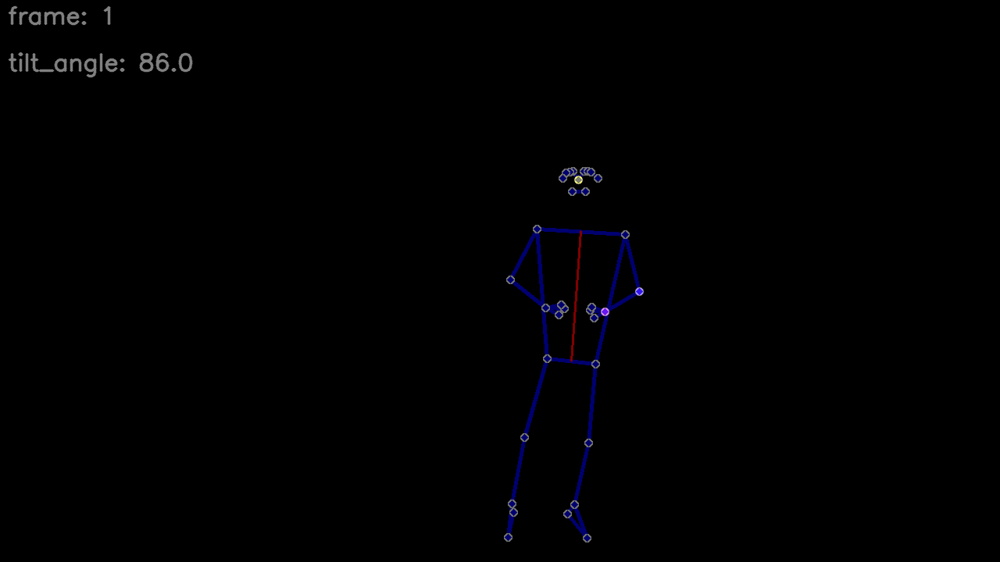

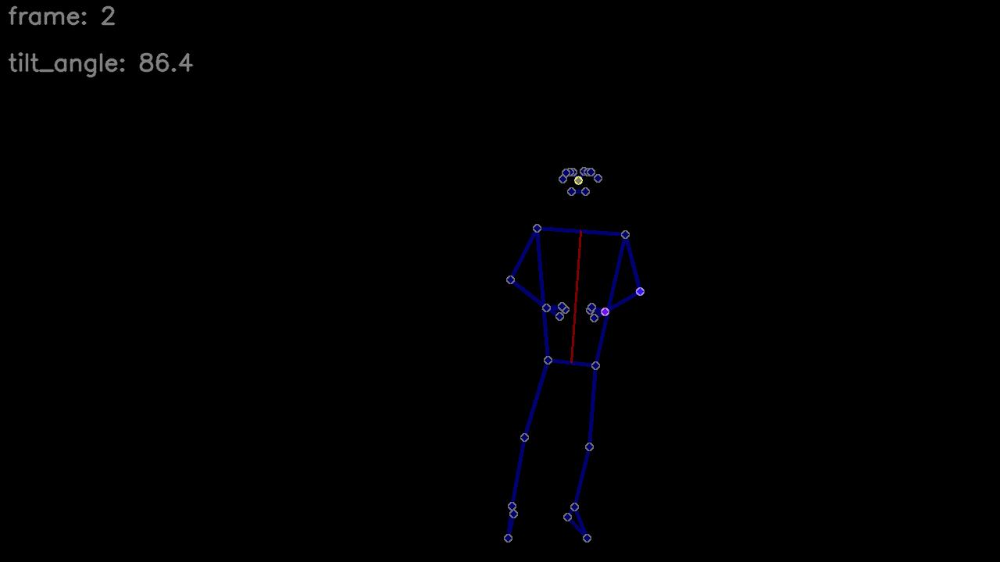

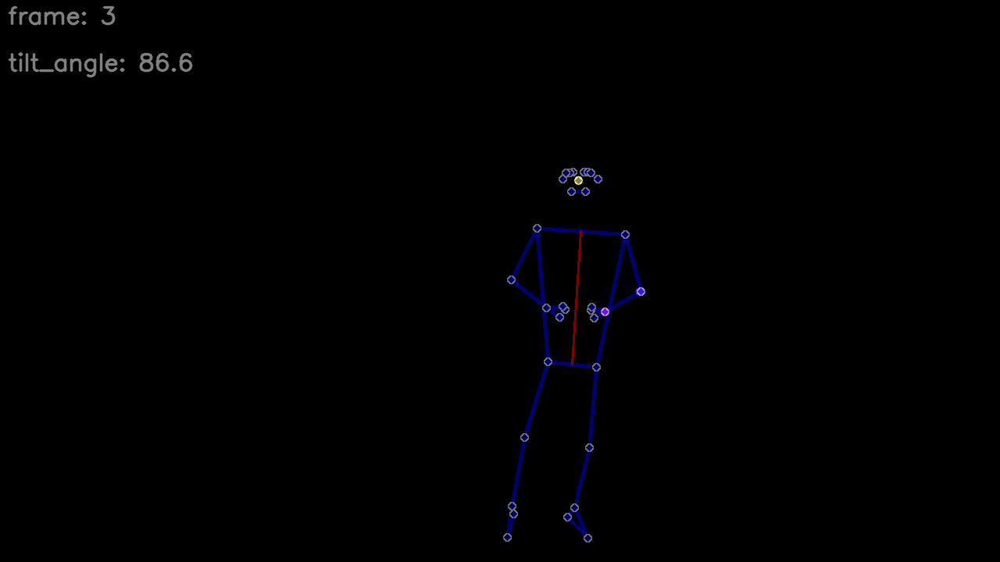

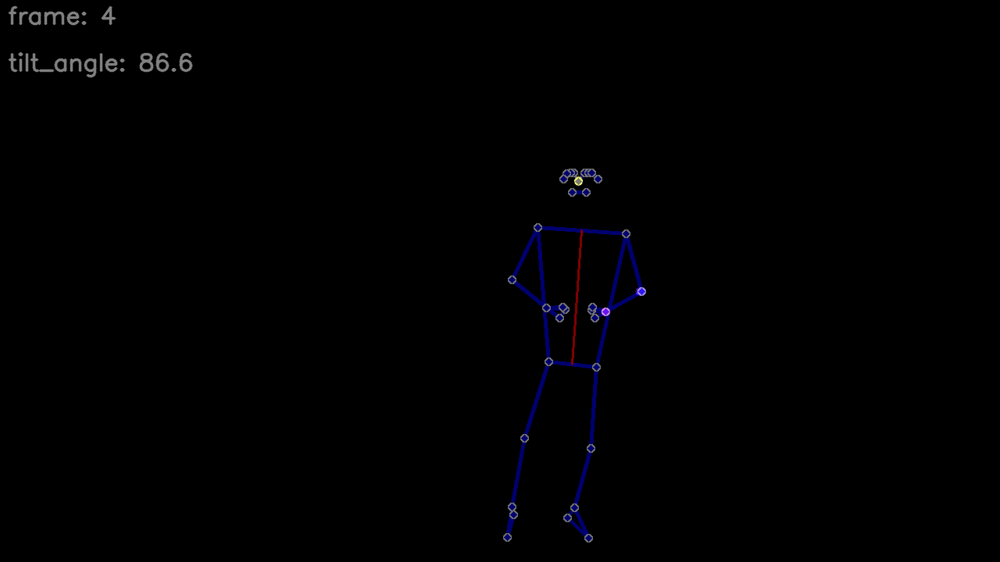

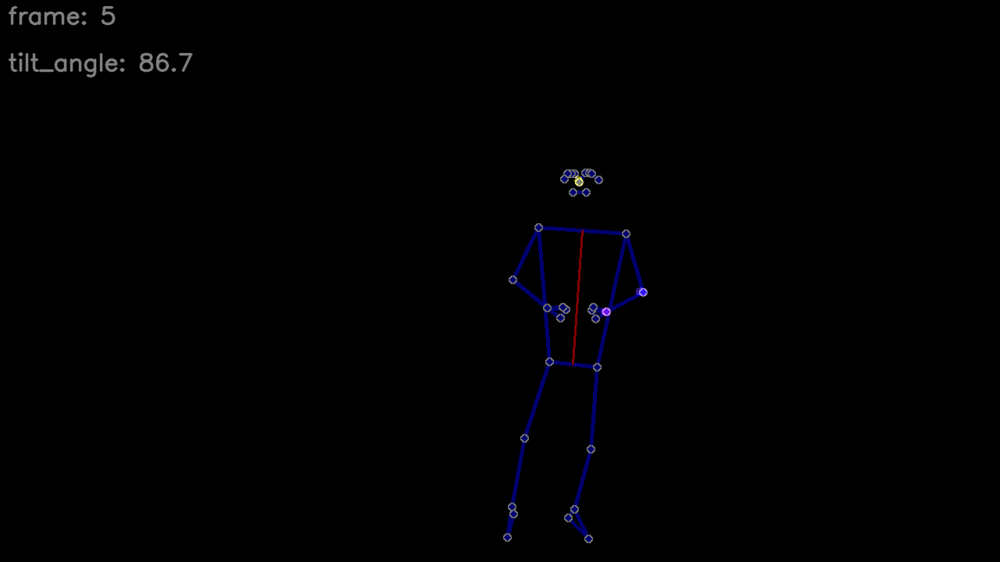

...

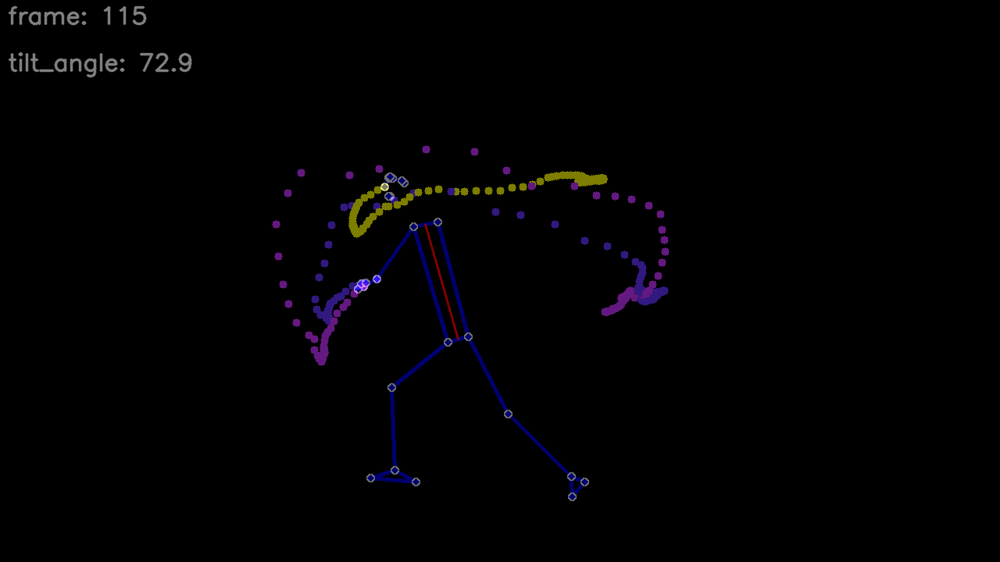

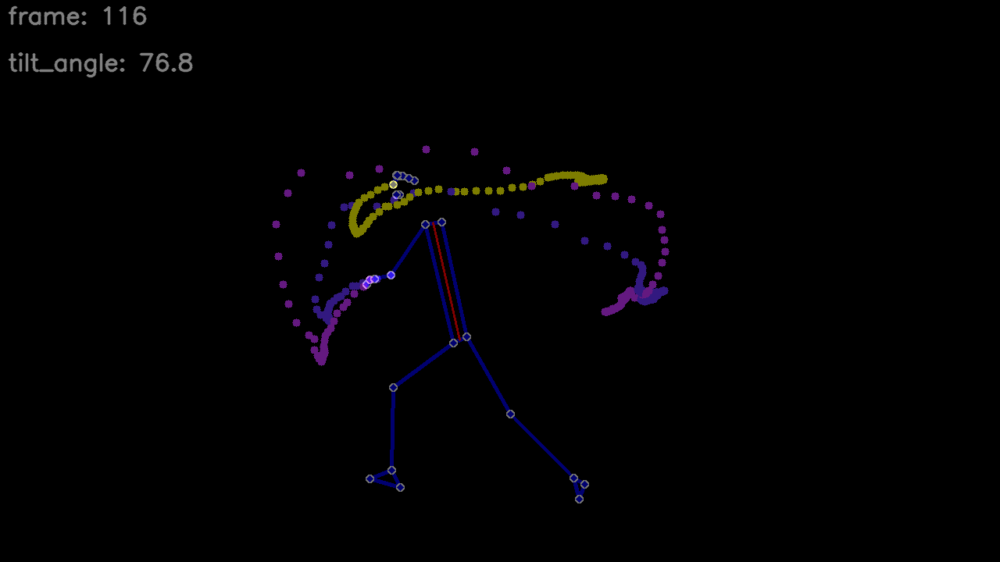

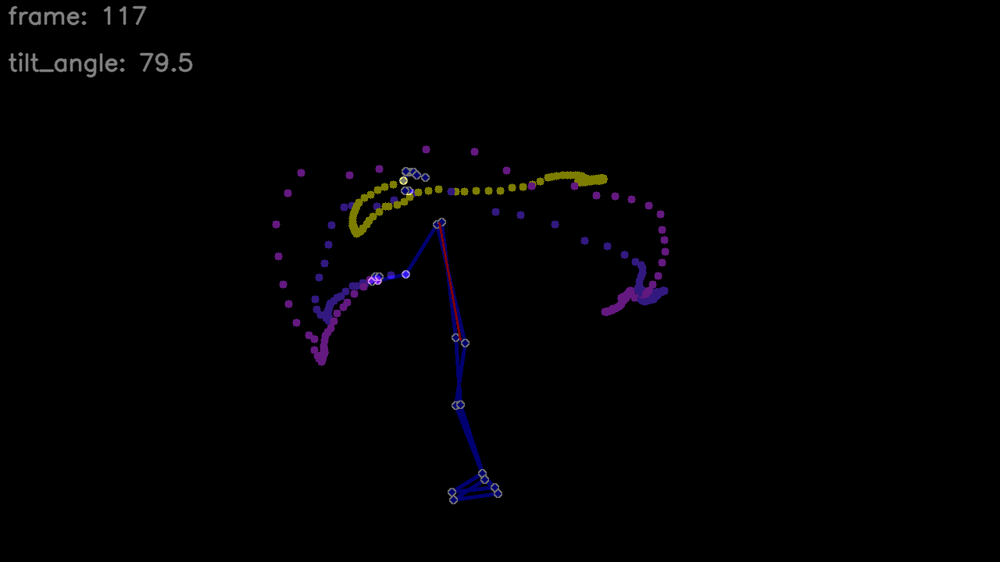

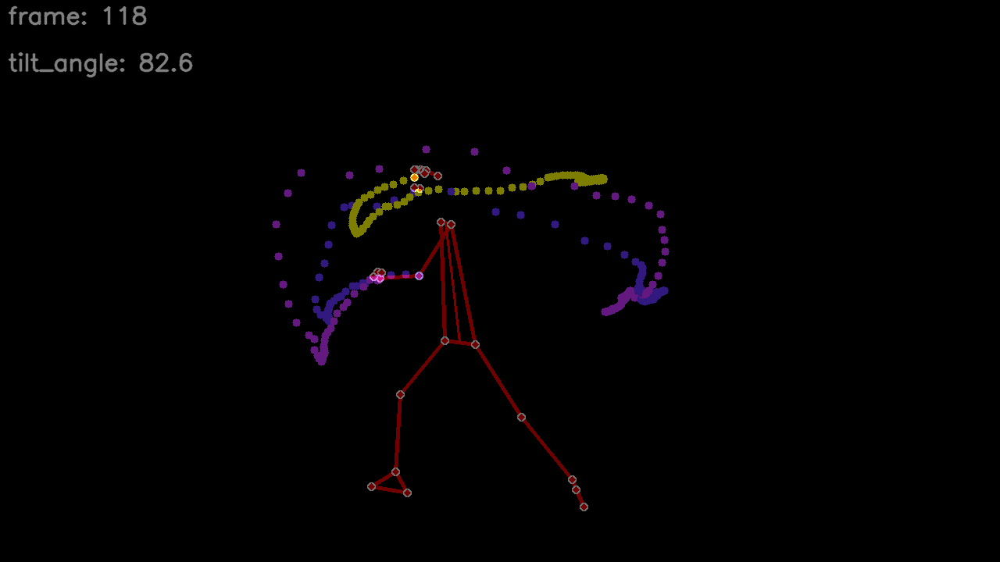

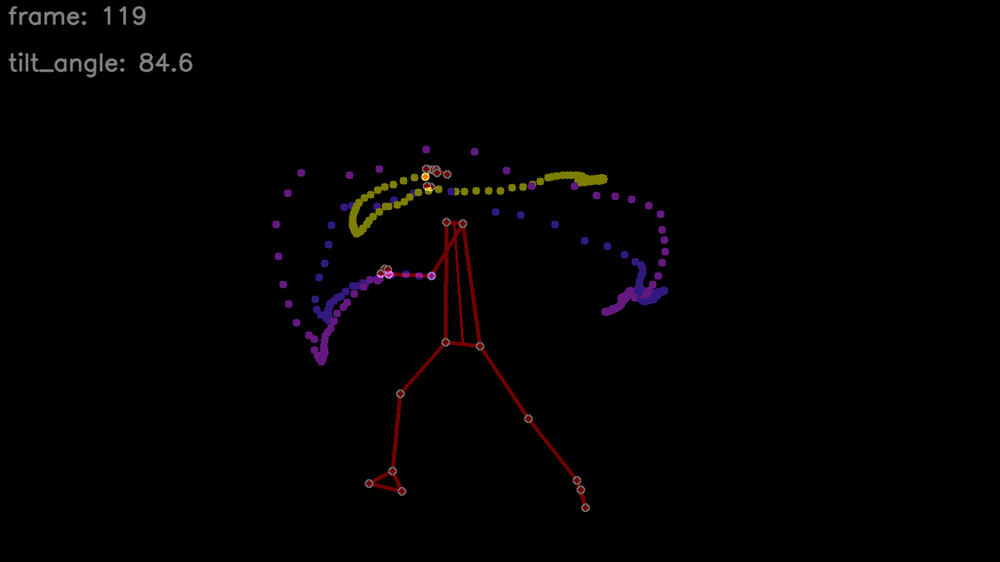

In [26]:
# @title
import cv2
import mediapipe as mp
import csv
import os
import lightgbm as lgb
from datetime import datetime
import math
import numpy as np
import warnings
warnings.simplefilter('ignore')
# Import the cv2_imshow function from google.colab.patches
from google.colab.patches import cv2_imshow
#2点間の距離を計算する関数
def calculate_distance(x1, y1, x2, y2):
    return math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
#3点間の角度を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の角度を計算する

def calc_angle(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    absvec1 = np.linalg.norm(vec1)
    absvec2 = np.linalg.norm(vec2)
    inner = np.inner(vec1, vec2)
    cos_theta = inner / (absvec1 * absvec2)
    if np.isnan(cos_theta):  # cos_thetaがNaNだった場合は0を返す
        return 0
    cos_theta_value = cos_theta.item()
    theta = math.degrees(math.acos(cos_theta_value))
    return theta
#3点間の外積を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の外積を計算する
def calc_outerproduct(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    outer = np.cross(vec1, vec2)
    outer = outer*1000 #数値が小さいので1000倍しておく
    return outer

#pklファイルを解凍する
import pickle
model_path = "throwdetect_trained_lgb_model_2side_20241123.pkl"
model = pickle.load(open(model_path, 'rb'))


# 骨格を検出するための準備
mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose
# 動画ファイルを読み込む
cap = cv2.VideoCapture(file_path)

# 出力用CSVファイルを作成する
csv_file_name = os.path.splitext(os.path.basename(file_path))[0] + '_' + datetime.now().strftime('%Y%m%d_%H%M%S') + '.csv'
save_folder = os.path.dirname(file_path)
csv_file_path = os.path.join(save_folder, csv_file_name)
mp4_file_name = csv_file_name.replace('.csv', '.mp4')
mp4_file_path = os.path.join(save_folder, mp4_file_name)
# 出力用MP4ファイルを作成する
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter(mp4_file_path, fourcc, fps, (frame_width, frame_height))

with open(csv_file_path, mode='w', newline='') as f:
    writer = csv.writer(f)
    header = ['frame']
    for i in range(33):
        header.append(f'x{i}')
        header.append(f'y{i}')
        header.append(f'z{i}')
    header.append("norm_rt_forearm_dist")
    header.append("norm_rt_uparm_dist")
    header.append("norm_rt_hip_dist")
    header.append("norm_rt_knee_dist")
    header.append("norm_lt_hip_dist")
    header.append("norm_lt_knee_dist")
    header.append("rt_elbow_angle")
    header.append("rt_shoulder_angle")
    header.append("lt_elbow_angle")
    header.append("lt_shoulder_angle")
    header.append("rt_hip_angle")
    header.append("rt_knee_angle")
    header.append("lt_hip_angle")
    header.append("lt_knee_angle")
    header.append("shoulder_dist")
    header.append("hip_dist")
    header.append("shoulder_hip_ratio")
    header.append("norm_rt_elbow_size")
    header.append("norm_rt_shoulder_size")
    header.append("norm_rt_trunk_size")
    header.append("norm_lt_trunk_size")
    header.append("norm_rt_hip_size")
    header.append("norm_rt_knee_size")
    header.append("norm_lt_hip_size")
    header.append("norm_lt_knee_size")
    header.append("tilt_angle")
    header.append('throw_phase')

    writer.writerow(header)
    #black_imageを作成
    black_image = np.zeros((frame_height, frame_width, 3), np.uint8)
    with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5, static_image_mode=False,  smooth_landmarks=True, enable_segmentation=False) as pose:
        while cap.isOpened():
            ret, image = cap.read()
            if not ret:
                break

            # 骨格を検出する
            results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

            if results.pose_world_landmarks:
                row = [None]
                # フレーム番号を取得する
                frame = cap.get(cv2.CAP_PROP_POS_FRAMES)
                row[0] = frame
                #black_image2を作成
                black_image2 = np.zeros((frame_height, frame_width, 3), np.uint8)
                for i in range(33):
                    row.append(results.pose_world_landmarks.landmark[i].x)
                    row.append(results.pose_world_landmarks.landmark[i].y)
                    row.append(results.pose_world_landmarks.landmark[i].z)

                #lightGBMに渡すパラメータを検出する
                #右肩、右肘、右手首、左肩、左肘、左手首、右股関節、右ひざ、右足関節、左股関節、左ひざ、左足関節の12点の座標を取得する
                rt_shoulder_x = results.pose_world_landmarks.landmark[12].x
                rt_shoulder_y = results.pose_world_landmarks.landmark[12].y
                rt_elbow_x = results.pose_world_landmarks.landmark[14].x
                rt_elbow_y = results.pose_world_landmarks.landmark[14].y
                rt_wrist_x = results.pose_world_landmarks.landmark[16].x
                rt_wrist_y = results.pose_world_landmarks.landmark[16].y
                lt_shoulder_x = results.pose_world_landmarks.landmark[11].x
                lt_shoulder_y = results.pose_world_landmarks.landmark[11].y
                lt_elbow_x = results.pose_world_landmarks.landmark[13].x
                lt_elbow_y = results.pose_world_landmarks.landmark[13].y
                lt_wrist_x = results.pose_world_landmarks.landmark[15].x
                lt_wrist_y = results.pose_world_landmarks.landmark[15].y
                rt_hip_x = results.pose_world_landmarks.landmark[24].x
                rt_hip_y = results.pose_world_landmarks.landmark[24].y
                rt_knee_x = results.pose_world_landmarks.landmark[26].x
                rt_knee_y = results.pose_world_landmarks.landmark[26].y
                rt_ankle_x = results.pose_world_landmarks.landmark[28].x
                rt_ankle_y = results.pose_world_landmarks.landmark[28].y
                lt_hip_x = results.pose_world_landmarks.landmark[23].x
                lt_hip_y = results.pose_world_landmarks.landmark[23].y
                lt_knee_x = results.pose_world_landmarks.landmark[25].x
                lt_knee_y = results.pose_world_landmarks.landmark[25].y
                lt_ankle_x = results.pose_world_landmarks.landmark[27].x
                lt_ankle_y = results.pose_world_landmarks.landmark[27].y
                #右手関節ー右肘間の距離を計算
                rt_forearm_dist =calculate_distance(rt_wrist_x, rt_wrist_y, rt_elbow_x, rt_elbow_y)
                #右肩ー右股関節の長さ（基準軸）を計算
                rt_trunk_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y)
                #右肩ー右肘の長さ(uparm_dist)を計算
                rt_uparm_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y)
                #右股関節ー右膝の長さ(rt_hip_dist)を計算
                rt_hip_dist=calculate_distance(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y)
                #右膝ー右足首の長さ(rt_knee_dist)を計算
                rt_knee_dist =calculate_distance(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝の長さ(lt_hip_dist)を計算
                lt_hip_dist =calculate_distance(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y)
                #左膝ー左足首の長さ(lt_knee_dist)を計算
                lt_knee_dist=calculate_distance (lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y)
                #サイズを標準化するためにforarm_dist, uparm_distをtrunk_distで割る
                norm_rt_forearm_dist=rt_forearm_dist/rt_trunk_dist
                norm_rt_uparm_dist=rt_uparm_dist/rt_trunk_dist
                norm_rt_hip_dist=rt_hip_dist/rt_trunk_dist
                norm_rt_knee_dist=rt_knee_dist/rt_trunk_dist
                norm_lt_hip_dist=lt_hip_dist/rt_trunk_dist
                norm_lt_knee_dist=lt_knee_dist/rt_trunk_dist
                #肩の幅
                shoulder_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y)
                #股関節の幅
                hip_dist=calculate_distance(rt_hip_x, rt_hip_y, lt_hip_x, lt_hip_y)
                #shoulder_distをhip_distで割りshouder_hip_ratioとする
                shoulder_hip_ratio=shoulder_dist/hip_dist
                #右肩ー右肘ー右手関節のなす角度を計算 1つ目の座標が原点となる座標を入力
                rt_elbow_angle = calc_angle (rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #右肘ー右肩―右股関節のなす角度を計算
                rt_shoulder_angle = calc_angle (rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y, rt_elbow_x, rt_elbow_y)
                #左肩ー左肘ー左手関節のなす角度を計算
                lt_elbow_angle= calc_angle (lt_elbow_x, lt_elbow_y, lt_shoulder_x, lt_shoulder_y, lt_wrist_x, lt_wrist_y)
                #左肘ー左肩ー左股関節のなす角度を計算
                lt_shoulder_angle = calc_angle (lt_shoulder_x, lt_shoulder_y, lt_hip_x, lt_hip_y, lt_elbow_x, lt_elbow_y)
                #右肩ー右股関節ー右膝のなす角度を計算
                rt_hip_angle = calc_angle(rt_hip_x, rt_hip_y, rt_shoulder_x, rt_shoulder_y, rt_knee_x, rt_knee_y)
                #右股関節ー右膝ー右足首のなす角度を計算
                rt_knee_angle= calc_angle(rt_knee_x, rt_knee_y, rt_hip_x, rt_hip_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_hip_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_knee_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)

                #rt_elbow sizeは右肘ー右肩　右肘ー右手関節ベクトルの外積
                rt_elbow_size = calc_outerproduct(rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #rt_shoulder sizeは右肩ー右肘　右肩ー右股関節ベクトルの外積
                rt_shoulder_size= calc_outerproduct(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y, rt_hip_x, rt_hip_y)
                #rt_trunk_sizeは右肩ー左肩　右肩ー右股関節ベクトルの外積
                rt_trunk_size = calc_outerproduct(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y, rt_hip_x, rt_hip_y)
                #lt_trunk_sizeは左肩ー右肩　左肩ー左股関節ベクトルの外積
                lt_trunk_size = calc_outerproduct(lt_shoulder_x, lt_shoulder_y, rt_shoulder_x, rt_shoulder_y, lt_hip_x, lt_hip_y)
                #rt_hip_sizeは右股関節ー右膝　右股関節ー右肩ベクトルの外積
                rt_hip_size = calc_outerproduct(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y, rt_shoulder_x, rt_shoulder_y)
                #rt_knee_sizeは右膝ー右足首　右膝ー右股関節ベクトルの外積
                rt_knee_size = calc_outerproduct(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y, rt_hip_x, rt_hip_y)
                #lt_hip_sizeは左股関節ー左膝　左股関節ー左肩ベクトルの外積
                lt_hip_size = calc_outerproduct(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y, lt_shoulder_x, lt_shoulder_y)
                #lt_knee_sizeは左膝ー左足首　左膝ー左股関節ベクトルの外積
                lt_knee_size = calc_outerproduct(lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y, lt_hip_x, lt_hip_y)
                #サイズを標準化するためにrt_elbow_size, rt_shoulder_sizeをrt_trunk_distの2乗で割る
                norm_rt_elbow_size=rt_elbow_size/(rt_trunk_dist**2)
                norm_rt_shoulder_size=rt_shoulder_size/(rt_trunk_dist**2)
                norm_rt_trunk_size=rt_trunk_size/(rt_trunk_dist**2)
                norm_lt_trunk_size=lt_trunk_size/(rt_trunk_dist**2)
                norm_rt_hip_size=rt_hip_size/(rt_trunk_dist**2)
                norm_rt_knee_size=rt_knee_size/(rt_trunk_dist**2)
                norm_lt_hip_size=lt_hip_size/(rt_trunk_dist**2)
                norm_lt_knee_size=lt_knee_size/(rt_trunk_dist**2)
                #両肩と両股関節の中心をとおる直線と垂直な直線とのなす角度を計算
                #両肩の中点を計算
                shoulder_center_x = (rt_shoulder_x + lt_shoulder_x) / 2
                shoulder_center_y = (rt_shoulder_y + lt_shoulder_y) / 2
                #両股関節の中点を計算
                hip_center_x = (rt_hip_x + lt_hip_x) / 2
                hip_center_y = (rt_hip_y + lt_hip_y) / 2
                #両肩の中点と両股関節の中点を結ぶ直線と垂直線とのなす角度を計算
                tilt_angle = np.arctan((hip_center_y - shoulder_center_y) / (hip_center_x - shoulder_center_x)) * 180 / np.pi
                tilt_angle = round(tilt_angle, 3)
                #tilt_angleの絶対値を取得
                tilt_angle = abs(tilt_angle)

                #機械学習モデルに渡すパラメータを出力する
                test_x=[norm_rt_forearm_dist, norm_rt_uparm_dist, norm_rt_hip_dist, norm_rt_knee_dist, norm_lt_hip_dist, norm_lt_knee_dist,  rt_elbow_angle, rt_shoulder_angle, lt_elbow_angle, lt_shoulder_angle, rt_hip_angle, rt_knee_angle, lt_hip_angle, lt_knee_angle, shoulder_hip_ratio, norm_rt_elbow_size,norm_rt_shoulder_size, norm_rt_trunk_size, norm_lt_trunk_size, norm_rt_hip_size, norm_rt_knee_size, norm_lt_hip_size, norm_lt_knee_size]
                #print(test_x)
                #lightGBMにパラメータを渡す
                #test_xをnumpyのarrayに変換
                test_x = np.array([test_x])
                #test_x=test_x.reshape(1,len(test_x))
                result = model.predict(test_x)
                row.append(norm_rt_forearm_dist)
                row.append(norm_rt_uparm_dist)
                row.append(norm_rt_hip_dist)
                row.append(norm_rt_knee_dist)
                row.append(norm_lt_hip_dist)
                row.append(norm_lt_knee_dist)
                row.append(rt_elbow_angle)
                row.append(rt_shoulder_angle)
                row.append(lt_elbow_angle)
                row.append(lt_shoulder_angle)
                row.append(rt_hip_angle)
                row.append(rt_knee_angle)
                row.append(lt_hip_angle)
                row.append(lt_knee_angle)
                row.append(shoulder_dist)
                row.append(hip_dist)
                row.append(shoulder_hip_ratio)
                row.append(norm_rt_elbow_size)
                row.append(norm_rt_shoulder_size)
                row.append(norm_rt_trunk_size)
                row.append(norm_lt_trunk_size)
                row.append(norm_rt_hip_size)
                row.append(norm_rt_knee_size)
                row.append(norm_lt_hip_size)
                row.append(norm_lt_knee_size)
                row.append(tilt_angle)
                row.append(result[0])
                writer.writerow(row)
                #print(result)

            # blacl_imageに骨格の検出結果を描画する　描画は元の画像に上書きするのでworld系の座標は用いない
            if results.pose_world_landmarks:
                color=[np.round(225*(1-result[0])),0,np.round(225*result[0])]
                color=np.asarray(color, dtype = int).tolist()
                drawing_spec = mp_drawing.DrawingSpec(color=color,thickness=4, circle_radius=2) #color=[B,G,R]で指定,線の太さと〇の色も指定可能
                mp_drawing.draw_landmarks(
                    black_image2, results.pose_landmarks, mp_pose.POSE_CONNECTIONS, landmark_drawing_spec=drawing_spec, connection_drawing_spec=drawing_spec)
                #black_image2にframe_numberを表示する
                cv2.putText(black_image2, f'frame: {int(frame)}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
                """#black_imageにnorm_rt_trunk_sizeを表示する
                cv2.putText(black_image2, f'norm_rt_trunk_size: {round(norm_rt_trunk_size, 1)}', (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
                """
                #black_imageにtilt_angleを表示する
                cv2.putText(black_image2, f'tilt_angle: {round(tilt_angle, 1)}', (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
                #ローカル座標での鼻・両肩・右肘・右手関節・両股関節の位置を取得する
                nose_local_x = int((results.pose_landmarks.landmark[0].x)*frame_width)
                nose_local_y = int((results.pose_landmarks.landmark[0].y)*frame_height)
                rt_shoulder_local_x = int((results.pose_landmarks.landmark[12].x)*frame_width)
                rt_shoulder_local_y = int((results.pose_landmarks.landmark[12].y)*frame_height)
                lt_shoulder_local_x = int((results.pose_landmarks.landmark[11].x)*frame_width)
                lt_shoulder_local_y = int((results.pose_landmarks.landmark[11].y)*frame_height)
                lt_elbow_local_x = int((results.pose_landmarks.landmark[13].x)*frame_width)
                lt_elbow_local_y = int((results.pose_landmarks.landmark[13].y)*frame_height)
                lt_wrist_local_x = int((results.pose_landmarks.landmark[15].x)*frame_width)
                lt_wrist_local_y = int((results.pose_landmarks.landmark[15].y)*frame_height)
                rt_hip_local_x = int((results.pose_landmarks.landmark[24].x)*frame_width)
                rt_hip_local_y = int((results.pose_landmarks.landmark[24].y)*frame_height)
                lt_hip_local_x = int((results.pose_landmarks.landmark[23].x)*frame_width)
                lt_hip_local_y = int((results.pose_landmarks.landmark[23].y)*frame_height)
                #両肩と両股関節の中点を定義
                shoulder_center_local_x = (rt_shoulder_local_x + lt_shoulder_local_x) / 2
                shoulder_center_local_y = (rt_shoulder_local_y + lt_shoulder_local_y) / 2
                hip_center_local_x = (rt_hip_local_x + lt_hip_local_x) / 2
                hip_center_local_y = (rt_hip_local_y + lt_hip_local_y) / 2

                #print(rt_shoulder_local_x, rt_shoulder_local_y, rt_elbow_local_x, rt_elbow_local_y, rt_wrist_local_x, rt_wrist_local_y)

                #black_imageに鼻・右肘・右手関節の位置を描画する
                cv2.circle(black_image, (nose_local_x, nose_local_y), 5, (0, 250, 250), -1)
                cv2.circle(black_image, (lt_elbow_local_x, lt_elbow_local_y), 5, (255, 50, 100), -1)
                cv2.circle(black_image, (lt_wrist_local_x, lt_wrist_local_y), 5, (255, 50, 200), -1)
                #black_image2に両肩の中点と両股関節の中点を結ぶ直線を描画する
                cv2.line(black_image2, (int(shoulder_center_local_x), int(shoulder_center_local_y)), (int(hip_center_local_x), int(hip_center_local_y)), (0, 0, 255), 2)


                #black_imageとblack_image2を合成する
                black_image2 = cv2.addWeighted(black_image, 0.5, black_image2, 0.5, 0)
                # 画像をMP4ファイルに書き込む
                out.write(black_image2)

            # 画像を表示する
            cv2_imshow( black_image2)

            if cv2.waitKey(5) & 0xFF == 27:
                break

# 後処理
cap.release()
out.release()
cv2.destroyAllWindows()


## 2つの動画の重ね合わせをしたい場合は下の再生ボタンをクリックして2つ目の動画をuploadする

In [4]:
# @title
# prompt: 動画ファイルをuploadしてfile_pathという変数に保存する
from google.colab import files

uploaded2= files.upload()

file_path2 = list(uploaded2.keys())[0]

print(f"Uploaded 2nd file path: {file_path2}")

Saving Inui_lt_flipped.mp4 to Inui_lt_flipped.mp4
Uploaded 2nd file path: Inui_lt_flipped.mp4


# 右投げの選手の場合は以下の再生ボタンを実行

In [5]:
# @title
## 2つの動画の特定の投球phaseを検出しimposeする
from datetime import datetime
import math
import numpy as np
#2点間の距離を計算する関数
def calculate_distance(x1, y1, x2, y2):
    return math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
#3点間の角度を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の角度を計算する

def calc_angle(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    absvec1 = np.linalg.norm(vec1)
    absvec2 = np.linalg.norm(vec2)
    inner = np.inner(vec1, vec2)
    cos_theta = inner / (absvec1 * absvec2)
    if np.isnan(cos_theta):  # cos_thetaがNaNだった場合は0を返す
        return 0
    cos_theta_value = cos_theta.item()
    theta = math.degrees(math.acos(cos_theta_value))
    return theta
#3点間の外積を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の外積を計算する
def calc_outerproduct(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    outer = np.cross(vec1, vec2)
    outer = outer*1000 #数値が小さいので1000倍しておく
    return outer
import cv2
import mediapipe as mp
import numpy as np
#import TkEasyGUI as sg
import os
import warnings
warnings.simplefilter('ignore')
# MediaPipeのセットアップ
mp_pose = mp.solutions.pose
#lightGBMモデルの指定 pklファイルを解凍する
import pickle
model_path = "throwdetect_trained_lgb_model_2side_20241123.pkl"
model = pickle.load(open(model_path, 'rb'))


def process_video(video_path, color, min_detection_confidence=0.2, min_tracking_confidence=0.2):
    cap = cv2.VideoCapture(video_path)
    frames = []
    rt_toe_x_list = []
    rt_toe_y_list = []
    trunk_tilt_angle_list = []
    with mp_pose.Pose(min_detection_confidence=min_detection_confidence, min_tracking_confidence=min_tracking_confidence) as pose:
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = pose.process(frame_rgb)
            #results.pose_landmarksがある場合
            if results.pose_landmarks:
                frame_black = np.zeros(frame.shape, dtype=np.uint8)
                #lightGBMに渡すパラメータを検出する
                #右肩、右肘、右手首、左肩、左肘、左手首、右股関節、右ひざ、右足関節、左股関節、左ひざ、左足関節の12点の座標を取得する
                rt_shoulder_x = results.pose_world_landmarks.landmark[12].x
                rt_shoulder_y = results.pose_world_landmarks.landmark[12].y
                rt_elbow_x = results.pose_world_landmarks.landmark[14].x
                rt_elbow_y = results.pose_world_landmarks.landmark[14].y
                rt_wrist_x = results.pose_world_landmarks.landmark[16].x
                rt_wrist_y = results.pose_world_landmarks.landmark[16].y
                lt_shoulder_x = results.pose_world_landmarks.landmark[11].x
                lt_shoulder_y = results.pose_world_landmarks.landmark[11].y
                lt_elbow_x = results.pose_world_landmarks.landmark[13].x
                lt_elbow_y = results.pose_world_landmarks.landmark[13].y
                lt_wrist_x = results.pose_world_landmarks.landmark[15].x
                lt_wrist_y = results.pose_world_landmarks.landmark[15].y
                rt_hip_x = results.pose_world_landmarks.landmark[24].x
                rt_hip_y = results.pose_world_landmarks.landmark[24].y
                rt_knee_x = results.pose_world_landmarks.landmark[26].x
                rt_knee_y = results.pose_world_landmarks.landmark[26].y
                rt_ankle_x = results.pose_world_landmarks.landmark[28].x
                rt_ankle_y = results.pose_world_landmarks.landmark[28].y
                lt_hip_x = results.pose_world_landmarks.landmark[23].x
                lt_hip_y = results.pose_world_landmarks.landmark[23].y
                lt_knee_x = results.pose_world_landmarks.landmark[25].x
                lt_knee_y = results.pose_world_landmarks.landmark[25].y
                lt_ankle_x = results.pose_world_landmarks.landmark[27].x
                lt_ankle_y = results.pose_world_landmarks.landmark[27].y
                #右手関節ー右肘間の距離を計算
                rt_forearm_dist =calculate_distance(rt_wrist_x, rt_wrist_y, rt_elbow_x, rt_elbow_y)
                #右肩ー右股関節の長さ（基準軸）を計算
                rt_trunk_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y)
                #右肩ー右肘の長さ(uparm_dist)を計算
                rt_uparm_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y)
                #右股関節ー右膝の長さ(rt_hip_dist)を計算
                rt_hip_dist=calculate_distance(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y)
                #右膝ー右足首の長さ(rt_knee_dist)を計算
                rt_knee_dist =calculate_distance(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝の長さ(lt_hip_dist)を計算
                lt_hip_dist =calculate_distance(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y)
                #左膝ー左足首の長さ(lt_knee_dist)を計算
                lt_knee_dist=calculate_distance (lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y)
                #サイズを標準化するためにforarm_dist, uparm_distをtrunk_distで割る
                norm_rt_forearm_dist=rt_forearm_dist/rt_trunk_dist
                norm_rt_uparm_dist=rt_uparm_dist/rt_trunk_dist
                norm_rt_hip_dist=rt_hip_dist/rt_trunk_dist
                norm_rt_knee_dist=rt_knee_dist/rt_trunk_dist
                norm_lt_hip_dist=lt_hip_dist/rt_trunk_dist
                norm_lt_knee_dist=lt_knee_dist/rt_trunk_dist
                #肩の幅
                shoulder_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y)
                #股関節の幅
                hip_dist=calculate_distance(rt_hip_x, rt_hip_y, lt_hip_x, lt_hip_y)
                #shoulder_distをhip_distで割りshouder_hip_ratioとする
                shoulder_hip_ratio=shoulder_dist/hip_dist
                #右肩ー右肘ー右手関節のなす角度を計算 1つ目の座標が原点となる座標を入力
                rt_elbow_angle = calc_angle (rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #右肘ー右肩―右股関節のなす角度を計算
                rt_shoulder_angle = calc_angle (rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y, rt_elbow_x, rt_elbow_y)
                #左肩ー左肘ー左手関節のなす角度を計算
                lt_elbow_angle= calc_angle (lt_elbow_x, lt_elbow_y, lt_shoulder_x, lt_shoulder_y, lt_wrist_x, lt_wrist_y)
                #左肘ー左肩ー左股関節のなす角度を計算
                lt_shoulder_angle = calc_angle (lt_shoulder_x, lt_shoulder_y, lt_hip_x, lt_hip_y, lt_elbow_x, lt_elbow_y)
                #右肩ー右股関節ー右膝のなす角度を計算
                rt_hip_angle = calc_angle(rt_hip_x, rt_hip_y, rt_shoulder_x, rt_shoulder_y, rt_knee_x, rt_knee_y)
                #右股関節ー右膝ー右足首のなす角度を計算
                rt_knee_angle= calc_angle(rt_knee_x, rt_knee_y, rt_hip_x, rt_hip_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_hip_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_knee_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)

                #rt_elbow sizeは右肘ー右肩　右肘ー右手関節ベクトルの外積
                rt_elbow_size = calc_outerproduct(rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #rt_shoulder sizeは右肩ー右肘　右肩ー右股関節ベクトルの外積
                rt_shoulder_size= calc_outerproduct(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y, rt_hip_x, rt_hip_y)
                #rt_trunk_sizeは右肩ー左肩　右肩ー右股関節ベクトルの外積
                rt_trunk_size = calc_outerproduct(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y, rt_hip_x, rt_hip_y)
                #lt_trunk_sizeは左肩ー右肩　左肩ー左股関節ベクトルの外積
                lt_trunk_size = calc_outerproduct(lt_shoulder_x, lt_shoulder_y, rt_shoulder_x, rt_shoulder_y, lt_hip_x, lt_hip_y)
                #rt_hip_sizeは右股関節ー右膝　右股関節ー右肩ベクトルの外積
                rt_hip_size = calc_outerproduct(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y, rt_shoulder_x, rt_shoulder_y)
                #rt_knee_sizeは右膝ー右足首　右膝ー右股関節ベクトルの外積
                rt_knee_size = calc_outerproduct(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y, rt_hip_x, rt_hip_y)
                #lt_hip_sizeは左股関節ー左膝　左股関節ー左肩ベクトルの外積
                lt_hip_size = calc_outerproduct(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y, lt_shoulder_x, lt_shoulder_y)
                #lt_knee_sizeは左膝ー左足首　左膝ー左股関節ベクトルの外積
                lt_knee_size = calc_outerproduct(lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y, lt_hip_x, lt_hip_y)
                #サイズを標準化するためにrt_elbow_size, rt_shoulder_sizeをrt_trunk_distの2乗で割る
                norm_rt_elbow_size=rt_elbow_size/(rt_trunk_dist**2)
                norm_rt_shoulder_size=rt_shoulder_size/(rt_trunk_dist**2)
                norm_rt_trunk_size=rt_trunk_size/(rt_trunk_dist**2)
                norm_lt_trunk_size=lt_trunk_size/(rt_trunk_dist**2)
                norm_rt_hip_size=rt_hip_size/(rt_trunk_dist**2)
                norm_rt_knee_size=rt_knee_size/(rt_trunk_dist**2)
                norm_lt_hip_size=lt_hip_size/(rt_trunk_dist**2)
                norm_lt_knee_size=lt_knee_size/(rt_trunk_dist**2)
                #両肩と両股関節の中心をとおる直線と垂直な直線とのなす角度を計算
                #両肩の中点を計算
                shoulder_center_x = (rt_shoulder_x + lt_shoulder_x) / 2
                shoulder_center_y = (rt_shoulder_y + lt_shoulder_y) / 2
                #両股関節の中点を計算
                hip_center_x = (rt_hip_x + lt_hip_x) / 2
                hip_center_y = (rt_hip_y + lt_hip_y) / 2
                #両肩の中点と両股関節の中点を結ぶ直線と垂直線とのなす角度を計算
                tilt_angle = np.arctan((hip_center_y - shoulder_center_y) / (hip_center_x - shoulder_center_x)) * 180 / np.pi
                tilt_angle = round(tilt_angle, 3)
                #tilt_angleの絶対値を取得
                tilt_angle = abs(tilt_angle)

                #機械学習モデルに渡すパラメータを出力する
                test_x=[norm_rt_forearm_dist, norm_rt_uparm_dist, norm_rt_hip_dist, norm_rt_knee_dist, norm_lt_hip_dist, norm_lt_knee_dist,  rt_elbow_angle, rt_shoulder_angle, lt_elbow_angle, lt_shoulder_angle, rt_hip_angle, rt_knee_angle, lt_hip_angle, lt_knee_angle, shoulder_hip_ratio, norm_rt_elbow_size,norm_rt_shoulder_size, norm_rt_trunk_size, norm_lt_trunk_size, norm_rt_hip_size, norm_rt_knee_size, norm_lt_hip_size, norm_lt_knee_size]
                #print(test_x)

                #lightGBMにパラメータを渡して検出
                test_x = np.array([test_x])
                result = model.predict(test_x)
                #print(result)

                #result>0.8の場合にframe_blackに骨格を描画し、trunk_tilt_angle_listにtrunk_tilt_angleを追加　それ以外で描画しない
                if result>0.8:
                    mp.solutions.drawing_utils.draw_landmarks(
                    frame_black, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
                    mp.solutions.drawing_utils.DrawingSpec(color=color, thickness=2, circle_radius=2),
                    mp.solutions.drawing_utils.DrawingSpec(color=color, thickness=2, circle_radius=2))
                    #両肩の中点と両股関節の中点の座標を取得し、その座標をむすぶ直線を描画
                    left_shoulder = results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_SHOULDER]
                    right_shoulder = results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_SHOULDER]
                    left_hip = results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_HIP]
                    right_hip = results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_HIP]
                    shoulder_center_x = int((left_shoulder.x + right_shoulder.x) / 2 * frame.shape[1])
                    shoulder_center_y = int((left_shoulder.y + right_shoulder.y) / 2 * frame.shape[0])
                    hip_center_x = int((left_hip.x + right_hip.x) / 2 * frame.shape[1])
                    hip_center_y = int((left_hip.y + right_hip.y) / 2 * frame.shape[0])
                    cv2.line(frame_black, (shoulder_center_x, shoulder_center_y), (hip_center_x, hip_center_y), color, 2)
                    #trunk_tilt_angleとして肩の中点と股関節の中点をむすぶ直線の傾きを計算して弧度法で表示
                    trunk_tilt_angle = np.arctan2(hip_center_y - shoulder_center_y, hip_center_x - shoulder_center_x)
                    trunk_tilt_angle = np.rad2deg(trunk_tilt_angle)

                    #trunk_tilt_angle_listにtrunk_tilt_angleを追加
                    trunk_tilt_angle_list.append(trunk_tilt_angle)

                    frames.append(frame_black)
                    rt_toe_x_list.append(results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX].x)
                    rt_toe_y_list.append(results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX].y)

        cap.release()
        return frames, rt_toe_x_list, rt_toe_y_list, trunk_tilt_angle_list

def combine_videos(frames1, frames2, rt_toe_x_list1, rt_toe_y_list1, rt_toe_x_list2, rt_toe_y_list2, trunk_tilt_angle_list1, trunk_tilt_angle_list2):
    h, w, _ = frames1[0].shape
    combined_frames = []
    for frame1, frame2, rt_toe_x1, rt_toe_y1, rt_toe_x2, rt_toe_y2,trunk_tilt_angle1, trunk_tilt_angle2 in zip(frames1, frames2, rt_toe_x_list1, rt_toe_y_list1, rt_toe_x_list2, rt_toe_y_list2, trunk_tilt_angle_list1, trunk_tilt_angle_list2):
        if rt_toe_x1 is not None and rt_toe_y1 is not None and rt_toe_x2 is not None and rt_toe_y2 is not None:
            offset_x = int(rt_toe_x1 * w - rt_toe_x2 * w)
            offset_y = int(rt_toe_y1 * h - rt_toe_y2 * h)
            #cv2.rapAffineを使ってfrmae2をoffset_x, offset_yだけ平行移動
            M = np.float32([[1, 0, offset_x], [0, 1, offset_y]])
            frame2 = cv2.warpAffine(frame2, M, (w, h))
            #frame1とframe2を合成
            combined_frame = cv2.addWeighted(frame1, 1, frame2, 1, 0)
            #combined_frameに1st_movie RED, 2nd_movie BLUEをcv2.putTextで表示
            cv2.putText(combined_frame, '1st_movie', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
            cv2.putText(combined_frame, '2nd_movie', (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)
            #combined_frameにtrunk_tilt_angleをcv2.putTextで表示
            cv2.putText(combined_frame, 'trunk_tilt_angle: {:.2f}'.format(trunk_tilt_angle1), (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
            cv2.putText(combined_frame, 'trunk_tilt_angle: {:.2f}'.format(trunk_tilt_angle2), (10, 120), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)


        else:
            combined_frame = frame1
        combined_frames.append(combined_frame)
    return combined_frames

# 動画ファイルのパスと保存フォルダを指定
video_path1 = file_path
video_path2 = file_path2
save_folder = "/content/throwanalysis_googlecolab"

if video_path1 and video_path2 and save_folder:
    # 各動画の処理（1つ目の動画は赤、2つ目の動画は青で骨格検出）
    frames1, rt_toe_x_list1, rt_toe_y_list1, trunk_tilt_angle_list1 = process_video(video_path1, (0, 0, 255), min_detection_confidence=0.7, min_tracking_confidence=0.7)
    frames2, rt_toe_x_list2, rt_toe_y_list2, trunk_tilt_angle_list2 = process_video(video_path2, (255, 0, 0), min_detection_confidence=0.7, min_tracking_confidence=0.7)

    # frames1とframes2の長さを長い方に合わせて、短い方の最後のフレームを追加
    if len(frames1) > len(frames2):
        for i in range(len(frames1) - len(frames2)):
            frames2.append(frames2[-1])
            rt_toe_x_list2.append(rt_toe_x_list2[-1])
            rt_toe_y_list2.append(rt_toe_y_list2[-1])
            trunk_tilt_angle_list2.append(trunk_tilt_angle_list2[-1])

    else:
        for i in range(len(frames2) - len(frames1)):
            frames1.append(frames1[-1])
            rt_toe_x_list1.append(rt_toe_x_list1[-1])
            rt_toe_y_list1.append(rt_toe_y_list1[-1])
            trunk_tilt_angle_list1.append(trunk_tilt_angle_list1[-1])

    # 骨格を描画したフレームを組み合わせ
    combined_frames = combine_videos(frames1, frames2, rt_toe_x_list1, rt_toe_y_list1, rt_toe_x_list2, rt_toe_y_list2, trunk_tilt_angle_list1, trunk_tilt_angle_list2)

    # 結果を保存 ファイル名は1つ目と2つ目の動画のファイル名を結合
    output_path = os.path.join(save_folder, video_path1.split('/')[-1].split('.')[0] + '_' + video_path2.split('/')[-1].split('.')[0] + '.mp4')
    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), 30, (frames1[0].shape[1], frames1[0].shape[0]))
    for frame in combined_frames:
        out.write(frame)
    out.release()

    print("処理が完了しました。" + output_path + "を確認してください。")
else:
    print("動画ファイルまたは保存フォルダが選択されていません。")


処理が完了しました。/content/throwanalysis_googlecolab/Inui_rt_Inui_lt_flipped.mp4を確認してください。


# 左投げの選手の場合は以下の再生ボタンを実行

In [24]:
# @title
## 2つの動画の特定の投球phaseを検出しimposeする
from datetime import datetime
import math
import numpy as np
#2点間の距離を計算する関数
def calculate_distance(x1, y1, x2, y2):
    return math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
#3点間の角度を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の角度を計算する

def calc_angle(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    absvec1 = np.linalg.norm(vec1)
    absvec2 = np.linalg.norm(vec2)
    inner = np.inner(vec1, vec2)
    cos_theta = inner / (absvec1 * absvec2)
    if np.isnan(cos_theta):  # cos_thetaがNaNだった場合は0を返す
        return 0
    cos_theta_value = cos_theta.item()
    theta = math.degrees(math.acos(cos_theta_value))
    return theta
#3点間の外積を計算する関数　(x0, y0)を原点として、(x1, y1)と(x2, y2)の外積を計算する
def calc_outerproduct(x0, y0, x1, y1, x2, y2):
    vec1 = [x1 - x0, y1 - y0]
    vec2 = [x2 - x0, y2 - y0]
    outer = np.cross(vec1, vec2)
    outer = outer*1000 #数値が小さいので1000倍しておく
    return outer
import cv2
import mediapipe as mp
import numpy as np
#import PySimpleGUI as sg
#import TkEasyGUI as sg
import os
import warnings
warnings.simplefilter('ignore')
# MediaPipeのセットアップ
mp_pose = mp.solutions.pose
#lightGBMモデルの指定 pklファイルを解凍する
import pickle
model_path = "throwdetect_trained_lgb_model_2side_20241123.pkl"
model = pickle.load(open(model_path, 'rb'))


def process_video(video_path, color, min_detection_confidence=0.2, min_tracking_confidence=0.2):
    cap = cv2.VideoCapture(video_path)
    frames = []
    lt_toe_x_list = []
    lt_toe_y_list = []
    trunk_tilt_angle_list = []
    with mp_pose.Pose(min_detection_confidence=min_detection_confidence, min_tracking_confidence=min_tracking_confidence) as pose:
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = pose.process(frame_rgb)
            #results.pose_landmarksがある場合
            if results.pose_landmarks:
                frame_black = np.zeros(frame.shape, dtype=np.uint8)
                #lightGBMに渡すパラメータを検出する
                #右肩、右肘、右手首、左肩、左肘、左手首、右股関節、右ひざ、右足関節、左股関節、左ひざ、左足関節の12点の座標を取得する
                rt_shoulder_x = results.pose_world_landmarks.landmark[12].x
                rt_shoulder_y = results.pose_world_landmarks.landmark[12].y
                rt_elbow_x = results.pose_world_landmarks.landmark[14].x
                rt_elbow_y = results.pose_world_landmarks.landmark[14].y
                rt_wrist_x = results.pose_world_landmarks.landmark[16].x
                rt_wrist_y = results.pose_world_landmarks.landmark[16].y
                lt_shoulder_x = results.pose_world_landmarks.landmark[11].x
                lt_shoulder_y = results.pose_world_landmarks.landmark[11].y
                lt_elbow_x = results.pose_world_landmarks.landmark[13].x
                lt_elbow_y = results.pose_world_landmarks.landmark[13].y
                lt_wrist_x = results.pose_world_landmarks.landmark[15].x
                lt_wrist_y = results.pose_world_landmarks.landmark[15].y
                rt_hip_x = results.pose_world_landmarks.landmark[24].x
                rt_hip_y = results.pose_world_landmarks.landmark[24].y
                rt_knee_x = results.pose_world_landmarks.landmark[26].x
                rt_knee_y = results.pose_world_landmarks.landmark[26].y
                rt_ankle_x = results.pose_world_landmarks.landmark[28].x
                rt_ankle_y = results.pose_world_landmarks.landmark[28].y
                lt_hip_x = results.pose_world_landmarks.landmark[23].x
                lt_hip_y = results.pose_world_landmarks.landmark[23].y
                lt_knee_x = results.pose_world_landmarks.landmark[25].x
                lt_knee_y = results.pose_world_landmarks.landmark[25].y
                lt_ankle_x = results.pose_world_landmarks.landmark[27].x
                lt_ankle_y = results.pose_world_landmarks.landmark[27].y
                #右手関節ー右肘間の距離を計算
                rt_forearm_dist =calculate_distance(rt_wrist_x, rt_wrist_y, rt_elbow_x, rt_elbow_y)
                #右肩ー右股関節の長さ（基準軸）を計算
                rt_trunk_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y)
                #右肩ー右肘の長さ(uparm_dist)を計算
                rt_uparm_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y)
                #右股関節ー右膝の長さ(rt_hip_dist)を計算
                rt_hip_dist=calculate_distance(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y)
                #右膝ー右足首の長さ(rt_knee_dist)を計算
                rt_knee_dist =calculate_distance(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝の長さ(lt_hip_dist)を計算
                lt_hip_dist =calculate_distance(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y)
                #左膝ー左足首の長さ(lt_knee_dist)を計算
                lt_knee_dist=calculate_distance (lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y)
                #サイズを標準化するためにforarm_dist, uparm_distをtrunk_distで割る
                norm_rt_forearm_dist=rt_forearm_dist/rt_trunk_dist
                norm_rt_uparm_dist=rt_uparm_dist/rt_trunk_dist
                norm_rt_hip_dist=rt_hip_dist/rt_trunk_dist
                norm_rt_knee_dist=rt_knee_dist/rt_trunk_dist
                norm_lt_hip_dist=lt_hip_dist/rt_trunk_dist
                norm_lt_knee_dist=lt_knee_dist/rt_trunk_dist
                #肩の幅
                shoulder_dist=calculate_distance(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y)
                #股関節の幅
                hip_dist=calculate_distance(rt_hip_x, rt_hip_y, lt_hip_x, lt_hip_y)
                #shoulder_distをhip_distで割りshouder_hip_ratioとする
                shoulder_hip_ratio=shoulder_dist/hip_dist
                #右肩ー右肘ー右手関節のなす角度を計算 1つ目の座標が原点となる座標を入力
                rt_elbow_angle = calc_angle (rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #右肘ー右肩―右股関節のなす角度を計算
                rt_shoulder_angle = calc_angle (rt_shoulder_x, rt_shoulder_y, rt_hip_x, rt_hip_y, rt_elbow_x, rt_elbow_y)
                #左肩ー左肘ー左手関節のなす角度を計算
                lt_elbow_angle= calc_angle (lt_elbow_x, lt_elbow_y, lt_shoulder_x, lt_shoulder_y, lt_wrist_x, lt_wrist_y)
                #左肘ー左肩ー左股関節のなす角度を計算
                lt_shoulder_angle = calc_angle (lt_shoulder_x, lt_shoulder_y, lt_hip_x, lt_hip_y, lt_elbow_x, lt_elbow_y)
                #右肩ー右股関節ー右膝のなす角度を計算
                rt_hip_angle = calc_angle(rt_hip_x, rt_hip_y, rt_shoulder_x, rt_shoulder_y, rt_knee_x, rt_knee_y)
                #右股関節ー右膝ー右足首のなす角度を計算
                rt_knee_angle= calc_angle(rt_knee_x, rt_knee_y, rt_hip_x, rt_hip_y, rt_ankle_x, rt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_hip_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)
                #左股関節ー左膝ー左足首のなす角度を計算
                lt_knee_angle = calc_angle(lt_knee_x, lt_knee_y, lt_hip_x, lt_hip_y, lt_ankle_x, lt_ankle_y)

                #rt_elbow sizeは右肘ー右肩　右肘ー右手関節ベクトルの外積
                rt_elbow_size = calc_outerproduct(rt_elbow_x, rt_elbow_y, rt_shoulder_x, rt_shoulder_y, rt_wrist_x, rt_wrist_y)
                #rt_shoulder sizeは右肩ー右肘　右肩ー右股関節ベクトルの外積
                rt_shoulder_size= calc_outerproduct(rt_shoulder_x, rt_shoulder_y, rt_elbow_x, rt_elbow_y, rt_hip_x, rt_hip_y)
                #rt_trunk_sizeは右肩ー左肩　右肩ー右股関節ベクトルの外積
                rt_trunk_size = calc_outerproduct(rt_shoulder_x, rt_shoulder_y, lt_shoulder_x, lt_shoulder_y, rt_hip_x, rt_hip_y)
                #lt_trunk_sizeは左肩ー右肩　左肩ー左股関節ベクトルの外積
                lt_trunk_size = calc_outerproduct(lt_shoulder_x, lt_shoulder_y, rt_shoulder_x, rt_shoulder_y, lt_hip_x, lt_hip_y)
                #rt_hip_sizeは右股関節ー右膝　右股関節ー右肩ベクトルの外積
                rt_hip_size = calc_outerproduct(rt_hip_x, rt_hip_y, rt_knee_x, rt_knee_y, rt_shoulder_x, rt_shoulder_y)
                #rt_knee_sizeは右膝ー右足首　右膝ー右股関節ベクトルの外積
                rt_knee_size = calc_outerproduct(rt_knee_x, rt_knee_y, rt_ankle_x, rt_ankle_y, rt_hip_x, rt_hip_y)
                #lt_hip_sizeは左股関節ー左膝　左股関節ー左肩ベクトルの外積
                lt_hip_size = calc_outerproduct(lt_hip_x, lt_hip_y, lt_knee_x, lt_knee_y, lt_shoulder_x, lt_shoulder_y)
                #lt_knee_sizeは左膝ー左足首　左膝ー左股関節ベクトルの外積
                lt_knee_size = calc_outerproduct(lt_knee_x, lt_knee_y, lt_ankle_x, lt_ankle_y, lt_hip_x, lt_hip_y)
                #サイズを標準化するためにrt_elbow_size, rt_shoulder_sizeをrt_trunk_distの2乗で割る
                norm_rt_elbow_size=rt_elbow_size/(rt_trunk_dist**2)
                norm_rt_shoulder_size=rt_shoulder_size/(rt_trunk_dist**2)
                norm_rt_trunk_size=rt_trunk_size/(rt_trunk_dist**2)
                norm_lt_trunk_size=lt_trunk_size/(rt_trunk_dist**2)
                norm_rt_hip_size=rt_hip_size/(rt_trunk_dist**2)
                norm_rt_knee_size=rt_knee_size/(rt_trunk_dist**2)
                norm_lt_hip_size=lt_hip_size/(rt_trunk_dist**2)
                norm_lt_knee_size=lt_knee_size/(rt_trunk_dist**2)
                #両肩と両股関節の中心をとおる直線と垂直な直線とのなす角度を計算
                #両肩の中点を計算
                shoulder_center_x = (rt_shoulder_x + lt_shoulder_x) / 2
                shoulder_center_y = (rt_shoulder_y + lt_shoulder_y) / 2
                #両股関節の中点を計算
                hip_center_x = (rt_hip_x + lt_hip_x) / 2
                hip_center_y = (rt_hip_y + lt_hip_y) / 2
                #両肩の中点と両股関節の中点を結ぶ直線と垂直線とのなす角度を計算
                tilt_angle = np.arctan((hip_center_y - shoulder_center_y) / (hip_center_x - shoulder_center_x)) * 180 / np.pi
                tilt_angle = round(tilt_angle, 3)
                #tilt_angleの絶対値を取得
                tilt_angle = abs(tilt_angle)

                #機械学習モデルに渡すパラメータを出力する
                test_x=[norm_rt_forearm_dist, norm_rt_uparm_dist, norm_rt_hip_dist, norm_rt_knee_dist, norm_lt_hip_dist, norm_lt_knee_dist,  rt_elbow_angle, rt_shoulder_angle, lt_elbow_angle, lt_shoulder_angle, rt_hip_angle, rt_knee_angle, lt_hip_angle, lt_knee_angle, shoulder_hip_ratio, norm_rt_elbow_size,norm_rt_shoulder_size, norm_rt_trunk_size, norm_lt_trunk_size, norm_rt_hip_size, norm_rt_knee_size, norm_lt_hip_size, norm_lt_knee_size]
                #print(test_x)

                #lightGBMにパラメータを渡して検出
                test_x = np.array([test_x])
                result = model.predict(test_x)
                #rint(result)

                #result>0.8の場合にframe_blackに骨格を描画し、trunk_tilt_angle_listにtrunk_tilt_angleを追加　それ以外で描画しない
                if result>0.8:
                    mp.solutions.drawing_utils.draw_landmarks(
                    frame_black, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
                    mp.solutions.drawing_utils.DrawingSpec(color=color, thickness=2, circle_radius=2),
                    mp.solutions.drawing_utils.DrawingSpec(color=color, thickness=2, circle_radius=2))
                    #両肩の中点と両股関節の中点の座標を取得し、その座標をむすぶ直線を描画
                    left_shoulder = results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_SHOULDER]
                    right_shoulder = results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_SHOULDER]
                    left_hip = results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_HIP]
                    right_hip = results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_HIP]
                    shoulder_center_x = int((left_shoulder.x + right_shoulder.x) / 2 * frame.shape[1])
                    shoulder_center_y = int((left_shoulder.y + right_shoulder.y) / 2 * frame.shape[0])
                    hip_center_x = int((left_hip.x + right_hip.x) / 2 * frame.shape[1])
                    hip_center_y = int((left_hip.y + right_hip.y) / 2 * frame.shape[0])
                    cv2.line(frame_black, (shoulder_center_x, shoulder_center_y), (hip_center_x, hip_center_y), color, 2)
                    #trunk_tilt_angleとして肩の中点と股関節の中点をむすぶ直線の傾きを計算して弧度法で表示
                    trunk_tilt_angle = np.arctan2(hip_center_y - shoulder_center_y, hip_center_x - shoulder_center_x)
                    trunk_tilt_angle = np.rad2deg(trunk_tilt_angle)

                    #trunk_tilt_angle_listにtrunk_tilt_angleを追加
                    trunk_tilt_angle_list.append(trunk_tilt_angle)

                    frames.append(frame_black)
                    lt_toe_x_list.append(results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_FOOT_INDEX].x)
                    lt_toe_y_list.append(results.pose_landmarks.landmark[mp_pose.PoseLandmark.LEFT_FOOT_INDEX].y)

        cap.release()
        return frames, lt_toe_x_list, lt_toe_y_list, trunk_tilt_angle_list

def combine_videos(frames1, frames2, lt_toe_x_list1, lt_toe_y_list1, lt_toe_x_list2, lt_toe_y_list2, trunk_tilt_angle_list1, trunk_tilt_angle_list2):
    h, w, _ = frames1[0].shape
    combined_frames = []
    for frame1, frame2, lt_toe_x1, lt_toe_y1, lt_toe_x2, lt_toe_y2,trunk_tilt_angle1, trunk_tilt_angle2 in zip(frames1, frames2, lt_toe_x_list1, lt_toe_y_list1, lt_toe_x_list2, lt_toe_y_list2, trunk_tilt_angle_list1, trunk_tilt_angle_list2):
        if lt_toe_x1 is not None and lt_toe_y1 is not None and lt_toe_x2 is not None and lt_toe_y2 is not None:
            offset_x = int(lt_toe_x1 * w - lt_toe_x2 * w)
            offset_y = int(lt_toe_y1 * h - lt_toe_y2 * h)
            #cv2.rapAffineを使ってfrmae2をoffset_x, offset_yだけ平行移動
            M = np.float32([[1, 0, offset_x], [0, 1, offset_y]])
            frame2 = cv2.warpAffine(frame2, M, (w, h))
            #frame1とframe2を合成
            combined_frame = cv2.addWeighted(frame1, 1, frame2, 1, 0)
            #combined_frameに1st_movie RED, 2nd_movie BLUEをcv2.putTextで表示
            cv2.putText(combined_frame, '1st_movie', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
            cv2.putText(combined_frame, '2nd_movie', (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)
            #combined_frameにtrunk_tilt_angleをcv2.putTextで表示
            cv2.putText(combined_frame, 'trunk_tilt_angle: {:.2f}'.format(trunk_tilt_angle1), (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
            cv2.putText(combined_frame, 'trunk_tilt_angle: {:.2f}'.format(trunk_tilt_angle2), (10, 120), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)


        else:
            combined_frame = frame1
        combined_frames.append(combined_frame)
    return combined_frames

# 動画ファイルのパスと保存フォルダを指定
video_path1 = file_path
video_path2 = file_path2
save_folder = "/content/throwanalysis_googlecolab"

if video_path1 and video_path2 and save_folder:
    # 各動画の処理（1つ目の動画は赤、2つ目の動画は青で骨格検出）
    frames1, lt_toe_x_list1, lt_toe_y_list1, trunk_tilt_angle_list1 = process_video(video_path1, (0, 0, 255), min_detection_confidence=0.7, min_tracking_confidence=0.7)
    frames2, lt_toe_x_list2, lt_toe_y_list2, trunk_tilt_angle_list2 = process_video(video_path2, (255, 0, 0), min_detection_confidence=0.7, min_tracking_confidence=0.7)

    # frames1とframes2の長さを長い方に合わせて、短い方の最後のフレームを追加
    if len(frames1) > len(frames2):
        for i in range(len(frames1) - len(frames2)):
            frames2.append(frames2[-1])
            lt_toe_x_list2.append(lt_toe_x_list2[-1])
            lt_toe_y_list2.append(lt_toe_y_list2[-1])
            trunk_tilt_angle_list2.append(trunk_tilt_angle_list2[-1])

    else:
        for i in range(len(frames2) - len(frames1)):
            frames1.append(frames1[-1])
            lt_toe_x_list1.append(lt_toe_x_list1[-1])
            lt_toe_y_list1.append(lt_toe_y_list1[-1])
            trunk_tilt_angle_list1.append(trunk_tilt_angle_list1[-1])

    # 骨格を描画したフレームを組み合わせ
    combined_frames = combine_videos(frames1, frames2, lt_toe_x_list1, lt_toe_y_list1, lt_toe_x_list2, lt_toe_y_list2, trunk_tilt_angle_list1, trunk_tilt_angle_list2)

    # 結果を保存 ファイル名は1つ目と2つ目の動画のファイル名を結合
    output_path = os.path.join(save_folder, video_path1.split('/')[-1].split('.')[0] + '_' + video_path2.split('/')[-1].split('.')[0] + '.mp4')
    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), 30, (frames1[0].shape[1], frames1[0].shape[0]))
    for frame in combined_frames:
        out.write(frame)
    out.release()

    print("処理が完了しました。" + output_path + "を確認してください。")
else:
    print("動画ファイルまたは保存フォルダが選択されていません。")


処理が完了しました。/content/throwanalysis_googlecolab/Inui_lt (1)_Inui_rt_flipped.mp4を確認してください。
